# Import all relevant packages

In [14]:
#import all 
%matplotlib inline
import matplotlib
import sys, os
from pandas.io.parsers import read_csv
import numpy as np
import seaborn as sns
import pandas as pd
import sklearn.cluster as cluster
import matplotlib.pyplot as plt
import collections
import scipy
import itertools
#import floweaver
np.warnings.filterwarnings('ignore')
import pysam
import pyBigWig as bw
#%load_ext rpy2.ipython
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
pandas2ri.activate()

# Read in dataframe

#### This is necessary for computing percentages and later allele counts. If these are already computed and saved, move down to 'load computed datasets'.

In [15]:
df = pd.read_pickle('./VAN2988_Miseq_dataFrame_allscars_allplates.pickle.gz')
df.head()

gastruloid                   C5A9                                           \
cell                         A2_1 A2_10 A2_100 A2_101 A2_102 A2_103 A2_104   
chrom allele  site      scar                                                 
1     Missing 101555571 WT    NaN   NaN    NaN    NaN    NaN    NaN    NaN   
              10180923  WT    NaN   NaN    NaN    NaN    NaN    NaN    NaN   
              105740329 WT    NaN   NaN    NaN    NaN    NaN    NaN    NaN   
              106033839 WT    NaN   NaN    NaN    NaN    NaN    NaN    NaN   
              109203858 WT    NaN   NaN    NaN    NaN    NaN    NaN    NaN   

gastruloid                                         ...  C5F10              \
cell                         A2_105 A2_106 A2_107  ...  H2_90 H2_91 H2_92   
chrom allele  site      scar                       ...                      
1     Missing 101555571 WT      NaN    NaN    NaN  ...    NaN   NaN   NaN   
              10180923  WT      NaN    NaN    NaN  ...    NaN   NaN   NaN   
              105740329 WT      NaN    NaN    NaN  ...    NaN   NaN   NaN   
              106033839 WT      NaN    NaN    NaN  ...    NaN   NaN   NaN   
              109203858 WT      NaN    NaN    NaN  ...    NaN   NaN   NaN   

gastruloid                                                              
cell                         H2_93 H2_94 H2_95 H2_96 H2_97 H2_98 H2_99  
chrom allele  site      scar                                            
1     Missing 101555571 WT     NaN   NaN   NaN   NaN   NaN   NaN   NaN  
              10180923  WT     NaN   NaN   NaN   NaN   NaN   NaN   NaN  
              105740329 WT     NaN   NaN   NaN   NaN   NaN   NaN   NaN  
              106033839 WT     NaN   NaN   NaN   NaN   NaN   NaN   NaN  
              109203858 WT     NaN   NaN   NaN   NaN   NaN   NaN   NaN  

[5 rows x 3067 columns]

In [16]:
sf = df.loc['12']

sf_129 = sf.loc['129S1_SvImJ']
sf_B6 = sf.loc['C57BL_6NJ']

nonallelic = sf.drop(['C57BL_6NJ','129S1_SvImJ','129S1_SvImJ,C57BL_6NJ'])

indexNonAllelic = nonallelic.index.droplevel(0)
sf_nonallelic = nonallelic.copy()
sf_nonallelic.index = indexNonAllelic

# data quality plots

Here some basic checks are performed, such as total amount of reads per cell and amount of reads per chromosome. We amplify the scars in the IgH locus which is located on chomosome 12 (with some off-target sites caused by primer design). Amount of reads per chromosome are checked, for the whole dataset and for every gastruloid individually. Amount of reads per site are checked, separated by alleles.

In [17]:
pathToSaveData = '/Users/m.blotenburg/Documents/github/'

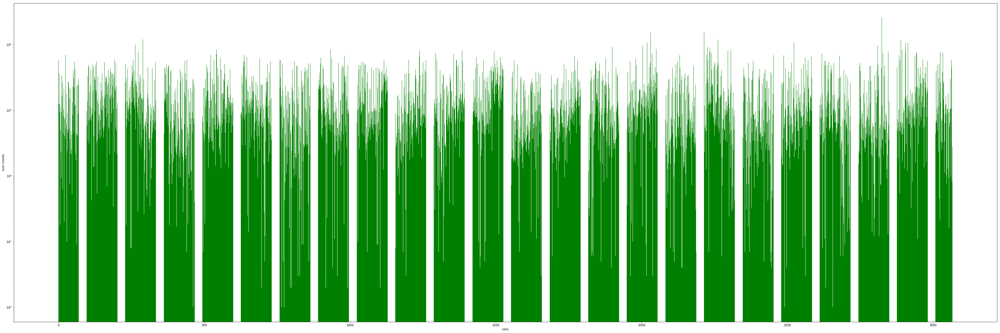

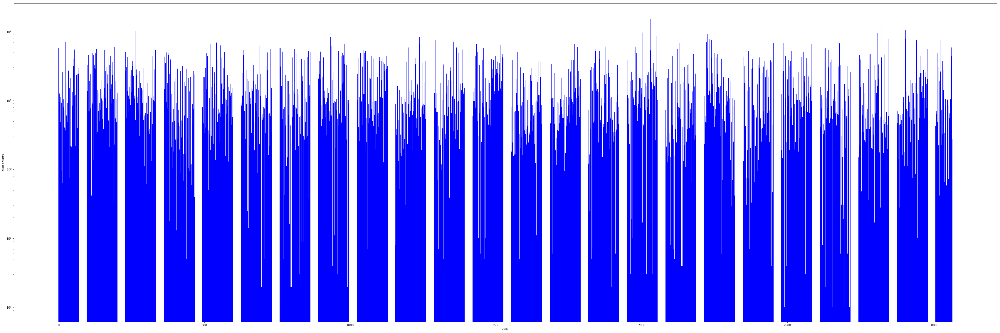

In [19]:
#all counts total
plt.figure(figsize=(60,20))

sums_cells = df.sum(axis=0)
plt.bar(range(len(df.columns)), sums_cells, log='y', color="green")
plt.xlabel('cells'); plt.ylabel('sum counts')
plt.show()

#all counts chr12
plt.figure(figsize=(60,20))

sums_cellsSF = sf.sum(axis=0)
plt.bar(range(len(sf.columns)), sums_cellsSF, log='y', color="blue")
plt.xlabel('cells'); plt.ylabel('sum counts')
plt.show()

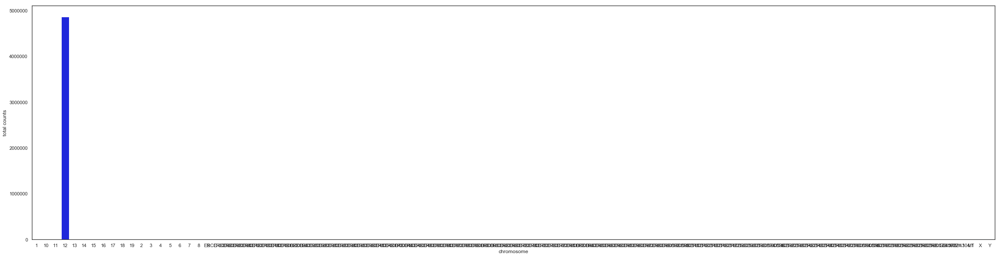

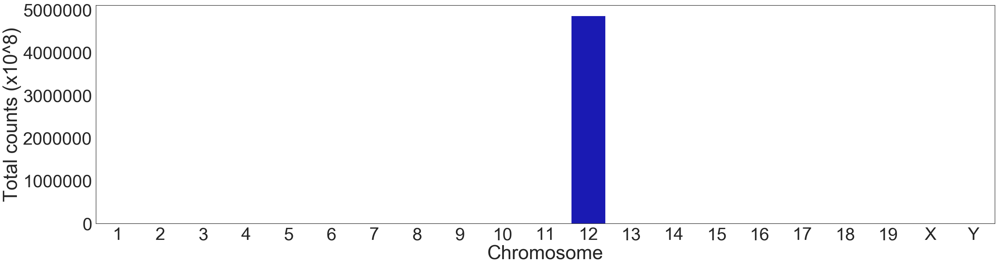

In [102]:
#Plot raw counts per chromosome
sums_cells = df.sum(axis=0, level=0)
countsPerChrom = sums_cells.sum(axis=1)
selection = countsPerChrom.iloc[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,99,100]]
sns.set(style="white")
plt.figure(figsize=(40,10))
ax = sns.barplot(x=countsPerChrom.index, y=countsPerChrom, palette="winter")
ax.set(xlabel='chromosome', ylabel='total counts')
plt.show()

order = [0,11,12,13,14,15,16,17,18,1,2,3,4,5,6,7,8,9,10,19,20]
orderedselection = selection.iloc[order]
orderedselection

sns.set(style="white", font_scale=4)
plt.figure(figsize=(40,10))

ax = sns.barplot(x=orderedselection.index, y=orderedselection, color='mediumblue')
ax.set(xlabel='Chromosome', ylabel='Total counts (x10^8)')
plt.show()

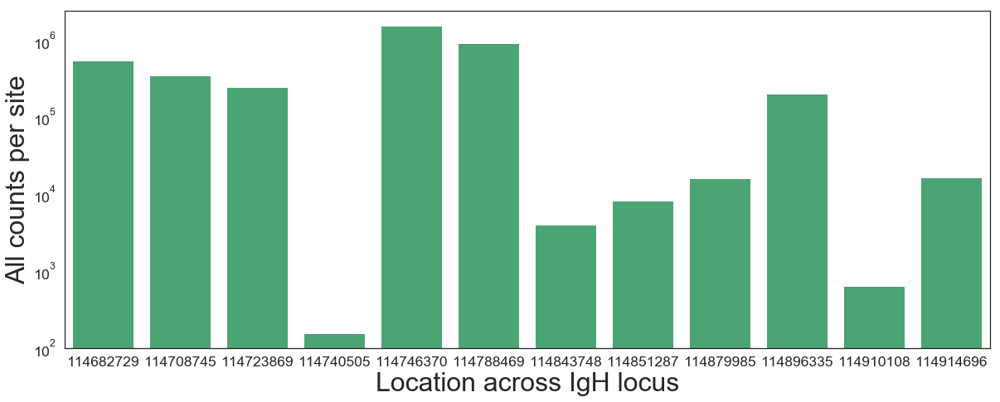

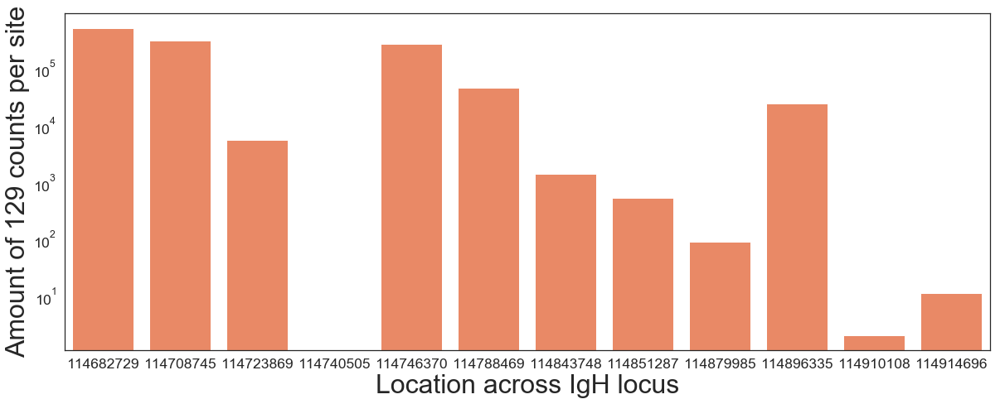

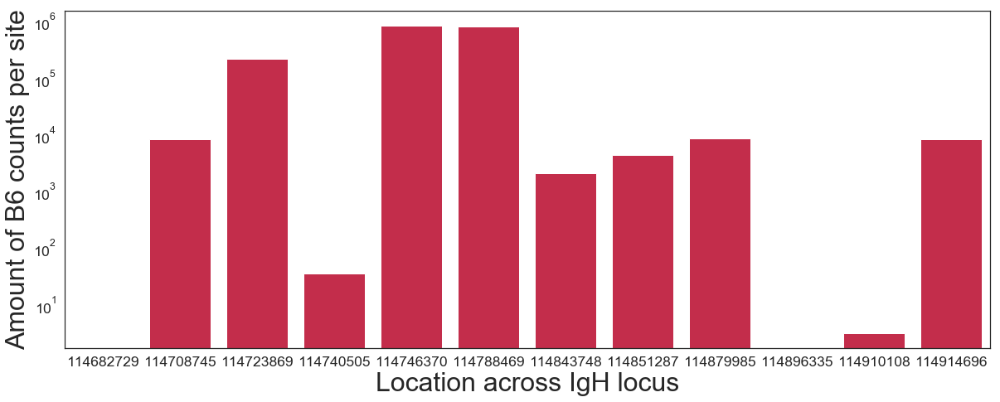

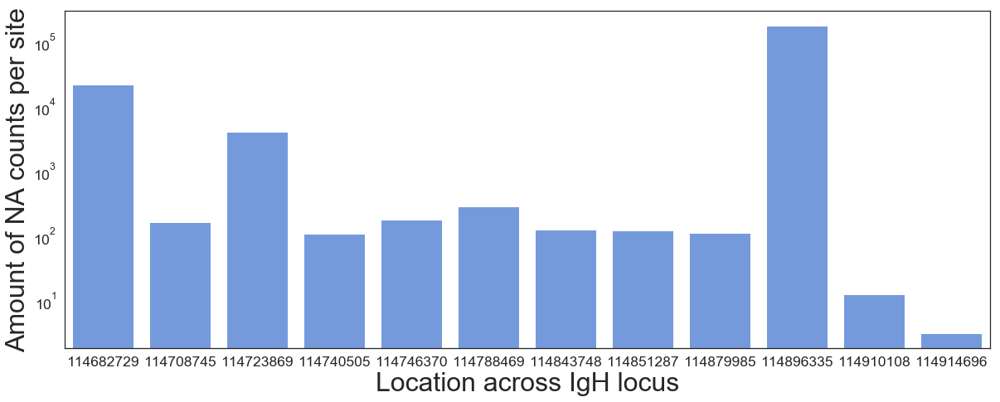

In [103]:
#dropping levels chr12 allele specific
index129 = sf_129.index.droplevel(1)
totalcountspersite_129 = sf_129.copy()
totalcountspersite_129.index = index129
sums_cells_129 = totalcountspersite_129.sum(axis=1)
sums_cells_129_merged = sums_cells_129.groupby('site').sum()

indexB6 = sf_B6.index.droplevel(1)
totalcountspersite_B6 = sf_B6.copy()
totalcountspersite_B6.index = indexB6
sums_cells_B6 = totalcountspersite_B6.sum(axis=1)
sums_cells_B6_merged = sums_cells_B6.groupby('site').sum()

indexNA = sf_nonallelic.index.droplevel(1)
totalcountspersite_NA = sf_nonallelic.copy()
totalcountspersite_NA.index = indexNA
sums_cells_NA = totalcountspersite_NA.sum(axis=1)
sums_cells_NA_merged = sums_cells_NA.groupby('site').sum()

sums_cells_B6_merged = sums_cells_B6_merged[sorted(sums_cells_B6_merged.index)]
sums_cells_B6_merged_pd = pd.DataFrame(sums_cells_B6_merged)
sums_cells_129_merged = sums_cells_129_merged[sorted(sums_cells_129_merged.index)]
sums_cells_129_merged_pd = pd.DataFrame(sums_cells_129_merged)
sums_cells_NA_merged = sums_cells_NA_merged[sorted(sums_cells_NA_merged.index)]
sums_cells_NA_merged_pd = pd.DataFrame(sums_cells_NA_merged)

B6_129_countspersite = pd.concat([sums_cells_B6_merged_pd,sums_cells_129_merged_pd,sums_cells_NA_merged_pd], axis=1, sort=True)
B6_129_countspersite.columns = ['B6', '129', 'NA']
B6_129_countspersite = B6_129_countspersite.fillna(0)

ratios129_2 = B6_129_countspersite['129'] / B6_129_countspersite.sum(axis=1)
ratiosB6_2 = B6_129_countspersite['B6'] / B6_129_countspersite.sum(axis=1)

selectedrawcounts = B6_129_countspersite.loc[['114682729','114708745','114723869','114740505','114746370','114788469',
                                              '114843748', '114851287','114879985','114896335','114910108','114914696']]


#### All counts for scarred sites
indexAllSites12 = sf.index.droplevel(0)
allSites12 = sf.copy()
allSites12.index = indexAllSites12

indexAllSitesChr12 = allSites12.index.droplevel(1)
allSitesChr12 = allSites12.copy()
allSitesChr12.index = indexAllSitesChr12
allSitesChr12

sums_cells_all = allSitesChr12.sum(axis=1)
sums_cells_all
sums_cells_all_merged = sums_cells_all.groupby('site').sum()

sums_cells_all_merged = sums_cells_all_merged[sorted(sums_cells_all_merged.index)]
sums_cells_all_merged_pd = pd.DataFrame(sums_cells_all_merged)

selectedrawcountsforall = sums_cells_all_merged_pd.loc[['114682729','114708745','114723869','114740505','114746370',
                                                        '114788469', '114843748', '114851287','114879985', 
                                                        '114896335','114910108','114914696']]
selectedrawcountsforall.columns = ['All']

sns.set(style="white")
plt.figure(figsize=(20,7.5))
ax = sns.barplot(x=selectedrawcountsforall.index, y=selectedrawcountsforall['All'], log='y', color='mediumseagreen')

plt.xlabel('Location across IgH locus', fontsize=32); plt.ylabel('All counts per site', fontsize=32)
ax.tick_params(labelsize=17.5)
plt.show()

#### All counts per allele for scarred sites
sns.set(style="white")
plt.figure(figsize=(20,7.5))
ax = sns.barplot(x=selectedrawcounts.index, y=selectedrawcounts['129'], log='y', color='coral')
ax.tick_params(labelsize=17.5)
plt.xlabel('Location across IgH locus', fontsize=32); plt.ylabel('Amount of 129 counts per site', fontsize=32)
plt.show()

sns.set(style="white")
plt.figure(figsize=(20,7.5))
ax = sns.barplot(x=selectedrawcounts.index, y=selectedrawcounts['B6'], log='y', color='crimson')
ax.tick_params(labelsize=17.5)
plt.xlabel('Location across IgH locus', fontsize=32); plt.ylabel('Amount of B6 counts per site', fontsize=32)
plt.show()

sns.set(style="white")
plt.figure(figsize=(20,7.5))
ax = sns.barplot(x=selectedrawcounts.index, y=selectedrawcounts['NA'], log='y', color='cornflowerblue')
ax.tick_params(labelsize=17.5)
plt.xlabel('Location across IgH locus', fontsize=32); plt.ylabel('Amount of NA counts per site', fontsize=32)
plt.show()

In [104]:
#Plot raw counts per chromosome per gastruloid
sums_cells = df.sum(axis=0, level=0)
sums_cells = sums_cells.iloc[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,99,100]]
order = [0,11,12,13,14,15,16,17,18,1,2,3,4,5,6,7,8,9,10,19,20]
orderedsumcells= sums_cells.iloc[order]

countsPerChromC5A9 = orderedsumcells['C5A9'].sum(axis=1)
countsPerChromC5B10 = orderedsumcells['C5B10'].sum(axis=1)
countsPerChromC5C6 = orderedsumcells['C5C6'].sum(axis=1)
countsPerChromC5F10 = orderedsumcells['C5F10'].sum(axis=1)
countsPerChromC5G7 = orderedsumcells['C5G7'].sum(axis=1)
countsPerChromC5H11 = orderedsumcells['C5H11'].sum(axis=1)
countsPerChromC5H7 = orderedsumcells['C5H7'].sum(axis=1)
countsPerChromC5H9 = orderedsumcells['C5H9'].sum(axis=1)

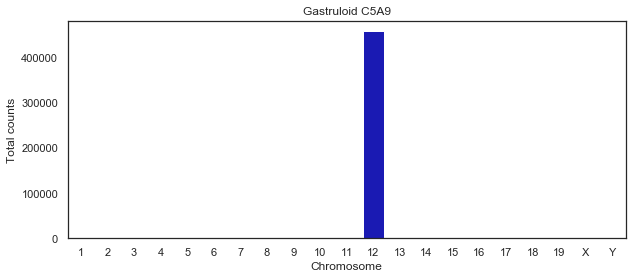

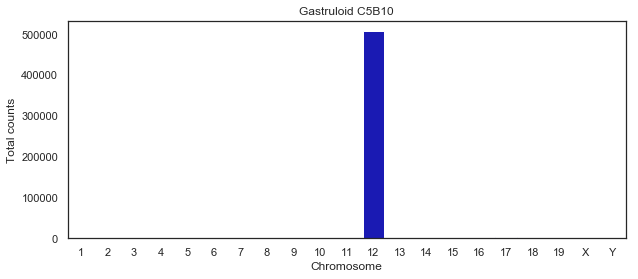

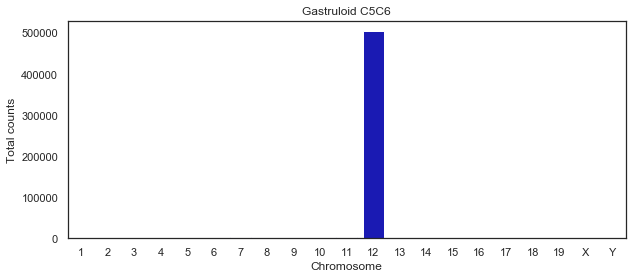

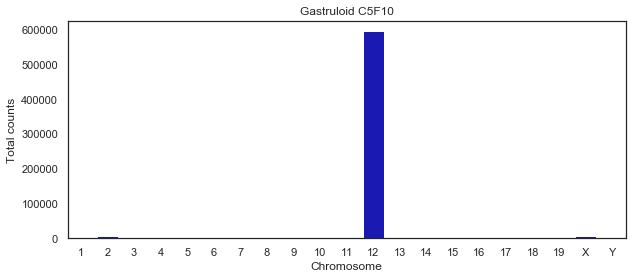

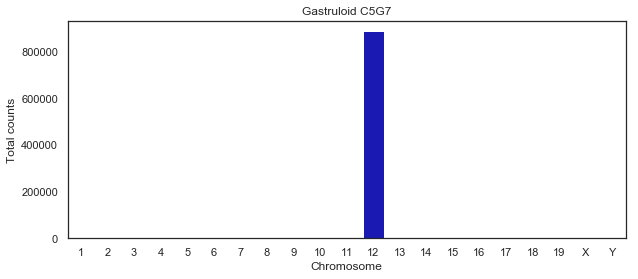

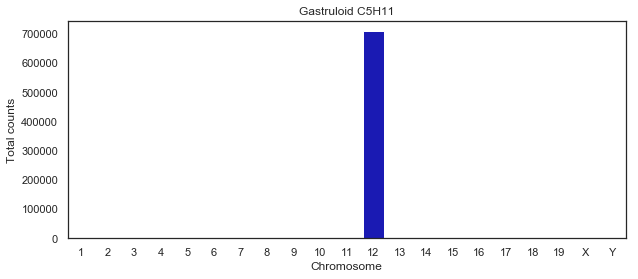

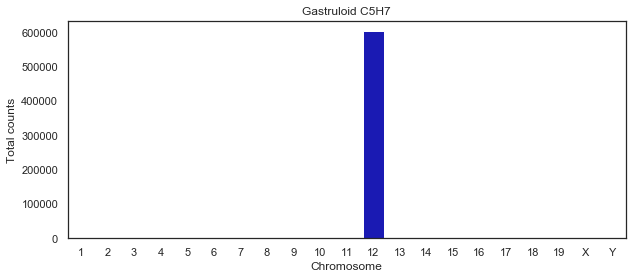

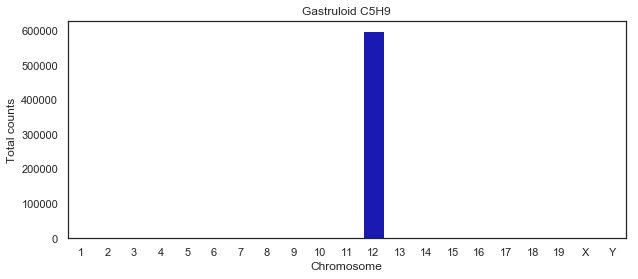

In [105]:
### Plot total counts per chromosome for each gastruloid independently
sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5A9.index, y=countsPerChromC5A9, color='mediumblue')
ax.set_title('Gastruloid C5A9')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5B10.index, y=countsPerChromC5B10, color='mediumblue')
ax.set_title('Gastruloid C5B10')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5C6.index, y=countsPerChromC5C6, color='mediumblue')
ax.set_title('Gastruloid C5C6')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5F10.index, y=countsPerChromC5F10, color='mediumblue')
ax.set_title('Gastruloid C5F10')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5G7.index, y=countsPerChromC5G7, color='mediumblue')
ax.set_title('Gastruloid C5G7')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5H11.index, y=countsPerChromC5H11, color='mediumblue')
ax.set_title('Gastruloid C5H11')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5H7.index, y=countsPerChromC5H7, color='mediumblue')
ax.set_title('Gastruloid C5H7')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

sns.set(style="white", font_scale=1)
plt.figure(figsize=(10,4))
ax = sns.barplot(x=countsPerChromC5H9.index, y=countsPerChromC5H9, color='mediumblue')
ax.set_title('Gastruloid C5H9')
ax.set(xlabel='Chromosome', ylabel='Total counts')
plt.show()

# Calculate percentages per allele for chromosome 12

#### This should only be necessary once. If this has been computed and saved already, move down to 'load computed datasets'.

In [107]:
sitesB6 = []
sites129 = []
sitesNA = []
for (chrom,allele,site,scar) in df.index:
    if chrom == '12':
        if allele == 'C57BL_6NJ':
            if site not in sitesB6:
                sitesB6.append(site)
        if allele == '129S1_SvImJ':
            if site not in sites129:
                sites129.append(site)
        if allele != 'C57BL_6NJ' and allele != '129S1_SvImJ' and allele !='129S1_SvImJ,C57BL_6NJ' :
            if site not in sitesNA:
                sitesNA.append(site)

In [109]:
#129
sf_129 = sf_129.fillna(0)
cellToSiteToScarPercentage129 = collections.defaultdict(lambda: collections.defaultdict(collections.Counter ))
for gastruloid, cell in sf_129.columns:
    for site in sites129:
        if len(sf_129.loc[site])==0:
            continue
        totalReadsForThisSite = sf_129.loc[site, (gastruloid, cell)].sum()
        if totalReadsForThisSite == 0:
            continue
        for scar, amountOfReads in sf_129.loc[site,(gastruloid, cell)].iteritems():
            percentage = (amountOfReads / totalReadsForThisSite)*100.0
            if percentage>5:
                cellToSiteToScarPercentage129[(gastruloid,cell)][int(site)][scar] += percentage

#129
percentagesChrom12 = collections.defaultdict(dict) # (cell, gastruloid)->(site,scar)-> value (.. ,1,2)

for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentage129.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(10):
            percentagesChrom12[(cell,gastruloid)][(site,scar)] = percentage

percentagesChr12_129 = pd.DataFrame(percentagesChrom12)

In [110]:
#B6
sf_B6 = sf_B6.fillna(0)
cellToSiteToScarPercentageB6 = collections.defaultdict(lambda: collections.defaultdict(collections.Counter ))
for gastruloid, cell in sf_B6.columns:
    for site in sitesB6:
        if len(sf_B6.loc[site])==0:
            continue
        totalReadsForThisSite = sf_B6.loc[site, (gastruloid, cell)].sum()
        if totalReadsForThisSite == 0:
            continue
        for scar, amountOfReads in sf_B6.loc[site,(gastruloid, cell)].iteritems():
            percentage = (amountOfReads / totalReadsForThisSite)*100.0
            if percentage>5:
                cellToSiteToScarPercentageB6[(gastruloid,cell)][int(site)][scar] += percentage


percentagesChr12B6 = collections.defaultdict(dict) # (cell, gastruloid)->(site,scar)-> value (.. ,1,2)
for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentageB6.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(10):
            percentagesChr12B6[(cell,gastruloid)][(site,scar)] = percentage

percentagesChr12_B6 = pd.DataFrame(percentagesChr12B6)

In [111]:
#nonallelic
sf_nonallelic = sf_nonallelic.fillna(0)                
cellToSiteToScarPercentageNA = collections.defaultdict(lambda: collections.defaultdict(collections.Counter ))
for gastruloid, cell in sf_nonallelic.columns:
    for site in sitesNA:
        if len(sf_nonallelic.loc[site])==0:
            continue
        totalReadsForThisSite = sf_nonallelic.loc[site, (gastruloid, cell)].sum()
        if totalReadsForThisSite == 0:
            continue
        for scar, amountOfReads in sf_nonallelic.loc[site,(gastruloid, cell)].iteritems():
            percentage = (amountOfReads / totalReadsForThisSite)*100.0
            if percentage>5:
                cellToSiteToScarPercentageNA[(gastruloid,cell)][int(site)][scar] += percentage

percentagesChr12NA = collections.defaultdict(dict) # (cell, gastruloid)->(site,scar)-> value (.. ,1,2)
for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentageNA.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(10):
            percentagesChr12NA[(cell,gastruloid)][(site,scar)] = percentage

percentagesChr12_NA = pd.DataFrame(percentagesChr12NA)

In [33]:
#to save dataframes
percentagesChr12_129.to_pickle('VAN2988_dataFramepercentagesChr12_129.pickle.gz')
percentagesChr12_B6.to_pickle('VAN2988_dataFramepercentagesChr12_B6.pickle.gz')
percentagesChr12_NA.to_pickle('VAN2988_dataFramepercentagesChr12_NA.pickle.gz')

# Converting to allele counts

#### This should only be necessary once. If this has been computed and saved already, move down to 'load computed datasets'.

In [34]:
#For 129:
alleleCountsChr12_129 = collections.defaultdict(dict)
for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentage129.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(2):
            if percentage >70: 
                alleleCountsChr12_129[(cell,gastruloid)][(site,scar)] = 1

alleleCountsChr12_129PD = pd.DataFrame(alleleCountsChr12_129)

In [35]:
# For B6:

alleleCountsChr12_B6 = collections.defaultdict(dict)
for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentageB6.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(2):
            if percentage >70: 
                alleleCountsChr12_B6[(cell,gastruloid)][(site,scar)] = 1

alleleCountsChr12_B6PD = pd.DataFrame(alleleCountsChr12_B6)

In [36]:
#'allelecounts' non-allelic
alleleCountsChr12_NA = collections.defaultdict(dict)
for (cell, gastruloid), allSitesForThisCell in cellToSiteToScarPercentageNA.items():
    for site, allScarsForThisSite in allSitesForThisCell.items():
        for scar, percentage in allScarsForThisSite.most_common(2):
            if percentage >70: 
                alleleCountsChr12_NA[(cell,gastruloid)][(site,scar)] = 2
            elif percentage >30 and percentage <70:
                alleleCountsChr12_NA[(cell,gastruloid)][(site,scar)] = 1

alleleCountsChr12_NAPD = pd.DataFrame(alleleCountsChr12_NA)        

In [37]:
#to save dataframes
alleleCountsChr12_129PD.to_pickle('VAN2988_dataFrameAlleleCountsChr12_129.pickle.gz')
alleleCountsChr12_B6PD.to_pickle('VAN2988_dataFrameAlleleCountsChr12_B6.pickle.gz')
alleleCountsChr12_NAPD.to_pickle('VAN2988_dataFrameAlleleCountsChr12_NA.pickle.gz')

# Make dataframes for sparse distance matrix (IWSS) clustering

#### This should only be necessary once. If this has been computed and saved already, move down to 'load computed datasets'.

In [119]:
targetsites = [114682729, 14708745, 114723869, 114740505,114746370, 114788469, 114843748, 114851287,
          114879985,114896335,114910108,114914696]

In [39]:
targetsites129 = []
targetsitesB6 = []
targetsitesNA = []
for site in targetsites:
    for index in alleleCountsChr12_129PD.index.levels[0]:
        if site == index:
            targetsites129.append(site)
    for index in alleleCountsChr12_B6PD.index.levels[0]:
        if site == index:
            targetsitesB6.append(site)
    for index in alleleCountsChr12_NAPD.index.levels[0]:
        if site == index:
            targetsitesNA.append(site)

In [40]:
allelecounts129_ts = alleleCountsChr12_129PD.loc[targetsites129]
allelecountsB6_ts = alleleCountsChr12_B6PD.loc[targetsitesB6]
allelecountsNA_ts = alleleCountsChr12_NAPD.loc[targetsitesNA]

In [41]:
allelecountsNA_ts.index = ['NA_' + str(site) for site in allelecountsNA_ts.index]
allelecountsB6_ts.index = ['B6_' + str(site) for site in allelecountsB6_ts.index]
allelecounts129_ts.index = ['129_' + str(site) for site in allelecounts129_ts.index]


In [42]:
dfs = [allelecountsNA_ts,allelecountsB6_ts,allelecounts129_ts]
all_allelecounts_fordistancecalc = pd.concat(dfs)


In [43]:
#to save 
all_allelecounts_fordistancecalc.to_pickle('VAN2988_all_allelecounts_fordistancecalc.pickle.gz')
allelecountsNA_ts.to_pickle('VAN2988_allelecountsNA_ts.pickle.gz')
allelecountsB6_ts.to_pickle('VAN2988_allelecountsB6_ts.pickle.gz')
allelecounts129_ts.to_pickle('VAN2988_allelecounts129_ts.pickle.gz')


# Making 'heatmap' dataframes for Buys' heatmap plotting

#### This should only be necessary once. If this has been computed and saved already, move down to 'load computed datasets'.

In [50]:
# for 129
alleleCountsChr12_129PD
heatmapAllele_129 = alleleCountsChr12_129PD.copy()
heatmapAlleleCounts_129 = collections.defaultdict(dict)
for (gastruloid, cell), allSitesForThisCell in heatmapAllele_129.items():
    for (site, scar), allelecounts in allSitesForThisCell.items():
        if allelecounts == 1.0:
            heatmapAlleleCounts_129[('129, ' + str(site))][(gastruloid,cell)] = scar
            
heatmapAlleleCounts_129Pd = pd.DataFrame(heatmapAlleleCounts_129)
heatmapAlleleCounts_129Pd.to_pickle('VAN2988_dataframeForHeatmap_All_129.pickle.gz')

In [51]:
# for B6
alleleCountsChr12_B6PD
heatmapAlleleCounts_B6 = collections.defaultdict(dict)
for (gastruloid, cell), allSitesForThisCell in alleleCountsChr12_B6PD.items():
    for (site, scar), allelecounts in allSitesForThisCell.items():
        if allelecounts == 1.0:
            heatmapAlleleCounts_B6[('B6, ' + str(site))][(gastruloid,cell)] = scar

heatmapAlleleCounts_B6PD = pd.DataFrame(heatmapAlleleCounts_B6)
heatmapAlleleCounts_B6PD.to_pickle('VAN2988_dataframeForHeatmap_All_B6.pickle.gz')

In [53]:
#nonallelic
heatmap_nonallelic = collections.defaultdict(dict)

for (gastruloid, cell), allSitesForThisCell in alleleCountsChr12_NAPD.items():
    for (site, scar), allelecounts in allSitesForThisCell.items():
        if allelecounts == 2.0:
            heatmap_nonallelic[('nonallelic, ' + str(site))][(gastruloid,cell)] = scar
            
heatmap_nonallelicPD = pd.DataFrame(heatmap_nonallelic)
heatmap_nonallelicPD.to_pickle('VAN2988_dataframeForHeatmap_All_nonallelic.pickle.gz')


In [57]:
dfs_all = [heatmap_129,heatmap_B6,heatmap_NA]
heatmap = dfs_all[0].join(dfs_all[1:],how='outer')


In [9]:
heatmap.to_pickle('VAN2988_dataframeForHeatmap_All.pickle.gz')

# Load computed datasets

#### Here you can load all precomputed datasets.

In [3]:
#to load dataframes containing all calculated percentages again
percentagesChr12_129 = pd.read_pickle('VAN2988_dataFramepercentagesChr12_129.pickle.gz')
percentagesChr12_B6 = pd.read_pickle('VAN2988_dataFramepercentagesChr12_B6.pickle.gz')
percentagesChr12_NA = pd.read_pickle('VAN2988_dataFramepercentagesChr12_NA.pickle.gz')

In [4]:
#to load dataframes containing all allele counts again
alleleCountsChr12_129PD = pd.read_pickle('VAN2988_dataFrameAlleleCountsChr12_129.pickle.gz')
alleleCountsChr12_B6PD = pd.read_pickle('VAN2988_dataFrameAlleleCountsChr12_B6.pickle.gz')
alleleCountsChr12_NAPD = pd.read_pickle('VAN2988_dataFrameAlleleCountsChr12_NA.pickle.gz')

In [5]:
#to load dataframes for distance calculation again
all_allelecounts_fordistancecalc = pd.read_pickle('VAN2988_all_allelecounts_fordistancecalc.pickle.gz')
allelecountsNA_ts = pd.read_pickle('VAN2988_allelecountsNA_ts.pickle.gz')
allelecountsB6_ts = pd.read_pickle('VAN2988_allelecountsB6_ts.pickle.gz')
allelecounts129_ts = pd.read_pickle('VAN2988_allelecounts129_ts.pickle.gz')

In [6]:
#to load dataframes for Buys' heatmap calculation again
heatmap_129 = pd.read_pickle('VAN2988_dataframeForHeatmap_All_129.pickle.gz')
heatmap_129.index.names = ['gastruloid', 'cell']
heatmap_B6 = pd.read_pickle('VAN2988_dataframeForHeatmap_All_B6.pickle.gz')
heatmap_B6.index.names = ['gastruloid', 'cell']
heatmap_NA = pd.read_pickle('VAN2988_dataframeForHeatmap_All_nonallelic.pickle.gz')
heatmap_NA.index.names = ['gastruloid', 'cell']

dfs_all = [heatmap_129,heatmap_B6,heatmap_NA]
heatmap = dfs_all[0].join(dfs_all[1:],how='outer')

#  Plotting percentages

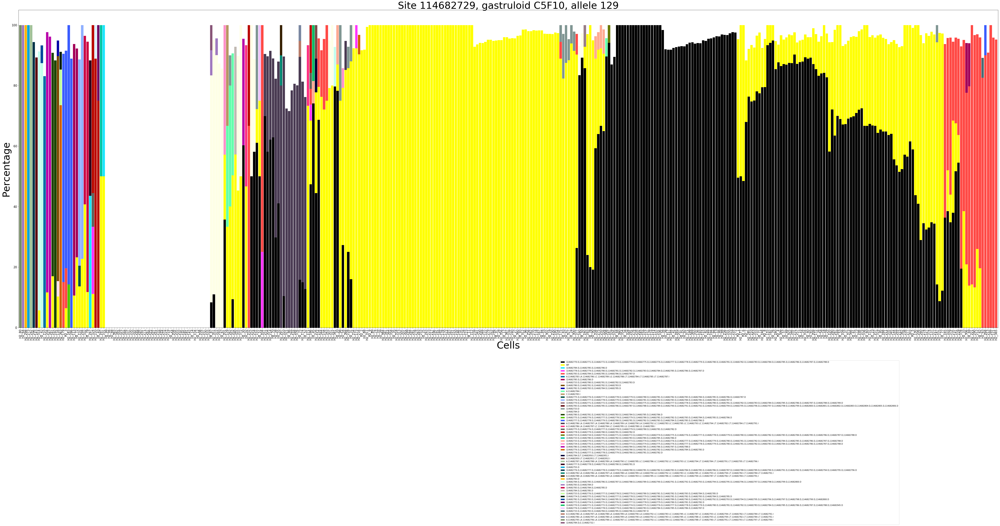

In [9]:
## plotting percentages of scars per cell for one site and all cells of one gastruloid

# specify gastruloid to plot
gastruloid = 'C5F10'
# specify site to plot
site = 114682729

percentagepersite = []
for cell in percentagesChr12_129[gastruloid]:
    percentagepersite.append(percentagesChr12_129[gastruloid][cell][site].dropna())

percentagepersitepd = pd.DataFrame(percentagepersite)

order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(percentagepersitepd.fillna(0)))
orderedpercentagepersitepd = percentagepersitepd.iloc[order]
ax = orderedpercentagepersitepd.plot.bar(stacked=True,figsize=(90,30),fontsize = 15,width=0.90, color=cols)
ax.set_xlabel("Cells",fontsize=50)
ax.set_title('Site 114682729, gastruloid C5F10, allele 129', fontsize=50)
ax.set_ylabel("Percentage",fontsize=50)
ax.legend(bbox_to_anchor=(0.9,-0.1))


# Plotting allele counts

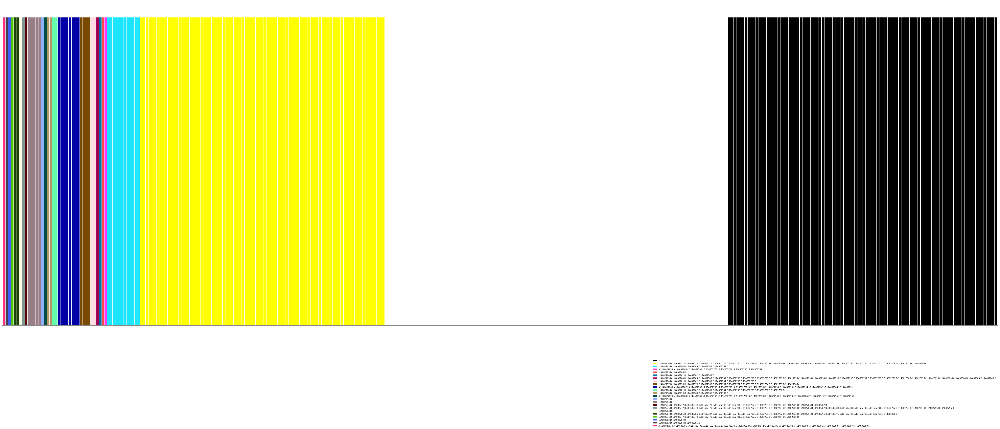

In [10]:
## plotting allele counts of scars per cell for one site and all cells of one gastruloid

# specify gastruloid to plot
gastruloid = 'C5F10'
# specify site to plot
site = 114682729


allelespersite = []
for cell in alleleCountsChr12_129PD[gastruloid]:
    allelespersite.append(alleleCountsChr12_129PD[gastruloid][cell][site].dropna())

allelespersitepd = pd.DataFrame(allelespersite)

order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(allelespersitepd.fillna(0)))

orderedallelepersitepd = allelespersitepd.iloc[order]
ax = orderedallelepersitepd.plot.bar(stacked=True,figsize=(90,30),fontsize = 30,width=0.90, 
                                     color=cols)
#ax.set_xlabel("Cells",fontsize=80)
ax.set_xticks([])
ax.set_yticks([])
#ax.set_title('Gastruloid C5F10, site 114788469, allele 129', fontsize=100)
#ax.set_ylabel("Allele count",fontsize=80)
ax.legend(bbox_to_anchor=(1,-0.1))

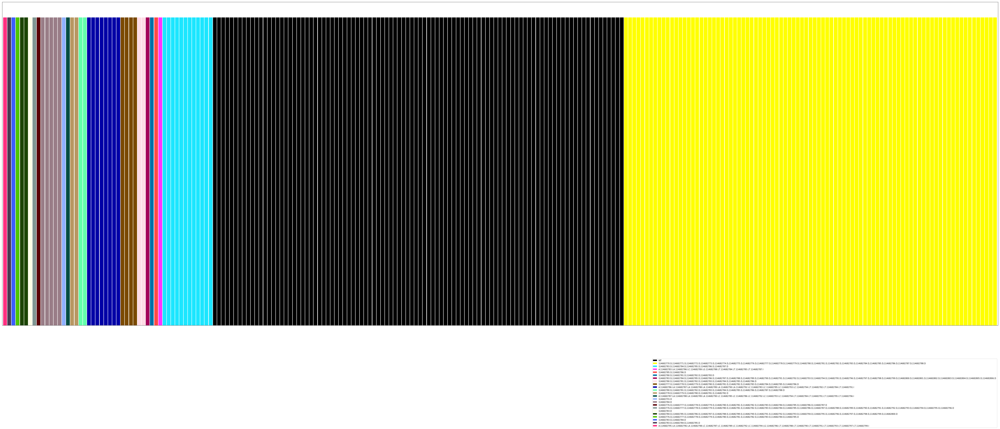

In [11]:
## plotting allele counts of scars per cell for one site and all cells of one gastruloid

# specify gastruloid to plot
gastruloid = 'C5F10'
# specify site to plot
site = 114682729

allelespersite = []
cellsnoinformation = []
cellsinformation = []
for cell in alleleCountsChr12_129PD[ gastruloid]:
    if alleleCountsChr12_129PD[gastruloid][cell][site].dropna().sum() == 0.0:
        cellsnoinformation.append(cell)
    if alleleCountsChr12_129PD[gastruloid][cell][site].dropna().sum() == 1.0:
        cellsinformation.append(cell)
        allelespersite.append(alleleCountsChr12_129PD[gastruloid][cell][site].dropna())


allelespersitepd = pd.DataFrame(allelespersite)

order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(allelespersitepd.fillna(0)))

orderedallelepersitepd = allelespersitepd.iloc[order]
ax = orderedallelepersitepd.plot.bar(stacked=True,figsize=(90,30),fontsize = 30,width=0.90, 
                                     color=cols)
#ax.set_xlabel("Cells",fontsize=80)
ax.set_xticks([])
ax.set_yticks([])
#ax.set_title('Gastruloid C5F10, site 114788469, allele 129', fontsize=100)
#ax.set_ylabel("Allele count",fontsize=80)
ax.legend(bbox_to_anchor=(1,-0.1))

# Buys 'heatmap' plot - to plot all scars for all sites 

### Rows are cells and columns are sites-alleles. Plots are made for each gastruloid separately.

In [138]:
df_targetsites = heatmap[['129, 114682729','nonallelic, 114682729',
                          '129, 114708745','B6, 114708745','nonallelic, 114708745',
                          '129, 114723869','B6, 114723869','nonallelic, 114723869',
                          'B6, 114740505','nonallelic, 114740505',
                          '129, 114746370','B6, 114746370','nonallelic, 114746370',
                          '129, 114788469','B6, 114788469','nonallelic, 114788469',
                          '129, 114843748','B6, 114843748','nonallelic, 114843748',
                          '129, 114851287','B6, 114851287','nonallelic, 114851287',
                          '129, 114879985','B6, 114879985','nonallelic, 114879985',
                          '129, 114896335','nonallelic, 114896335',
                          '129, 114910108', 'B6, 114910108','nonallelic, 114910108',
                          '129, 114914696','B6, 114914696','nonallelic, 114914696']]

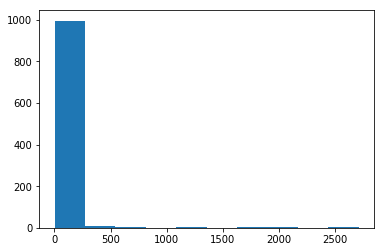

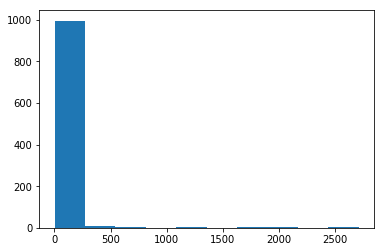

In [12]:
# Select sites with plenty of data:
plt.hist( (~pd.isnull(heatmap)).sum() )
plt.show()
df_selected = heatmap.loc[:, ((~pd.isnull(heatmap)).sum()>150) ]
plt.hist( (~pd.isnull(heatmap)).sum() )
plt.show()


In [140]:
## For the full dataset, not separated for each gastruloid yet
# define the total amount of scars
totalScars = set()
for i,r in df_targetsites.iterrows():
    totalScars.update( set( [x for x in r.unique() if not pd.isnull(x)]) )


In [141]:
## For the full dataset, not separated for each gastruloid yet
# define one colour for each scar
cmap = plt.get_cmap('hsv')
scarColors = { scar: cmap(x) for scar, x in zip(totalScars, np.linspace(0,1, len(totalScars))) }
scarColors['WT'] = (0,0,0)

In [21]:
# Determine organisation of the plot, based on site-allele with most information
df_targetsites = df_targetsites.sort_values([df_targetsites.columns[0],df_targetsites.columns[6],
                                            df_targetsites.columns[10],df_targetsites.columns[23],
                                            df_targetsites.columns[24],df_targetsites.columns[1]])


In [143]:
df_targetsites = df_targetsites[(~pd.isnull(df_targetsites)).sum(axis=1)>0]


In [144]:
# to plot all sites for only 129 and B6 alleles, without nonallelic
df_targetsites2 = df_targetsites[['129, 114682729',
                          '129, 114708745','B6, 114708745',
                          '129, 114723869','B6, 114723869',
                          'B6, 114740505',
                          '129, 114746370','B6, 114746370',
                          '129, 114788469','B6, 114788469',
                          '129, 114843748','B6, 114843748',
                          '129, 114851287','B6, 114851287',
                          '129, 114879985','B6, 114879985',
                          '129, 114896335',
                          '129, 114910108', 'B6, 114910108',
                          '129, 114914696','B6, 114914696']]


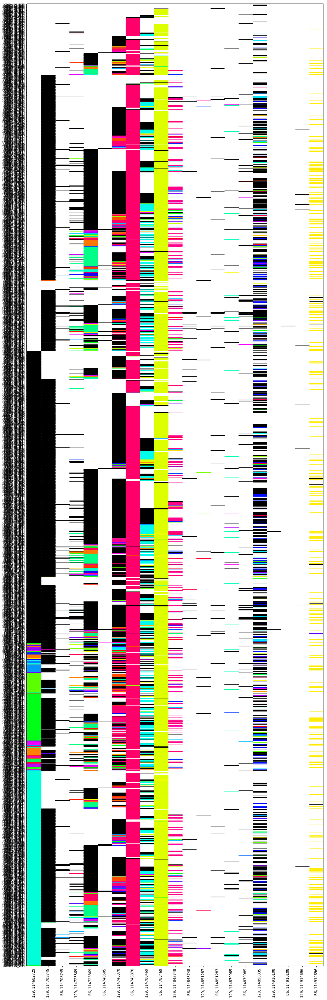

In [24]:
# plot all cells, all gastruloids, no nonallelic
fig, ax = plt.subplots(1, figsize=(15,50))
columnsCount = df_targetsites2.shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites2.iterrows()):
    for columnIndex,column in enumerate(df_targetsites2.columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColors[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites2.shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites2.shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites2.columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites2.columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites2.index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites2.index)],fontsize=6.5)

#plt.savefig('./allcells_allgastruloids.png', dpi=300)
plt.show()


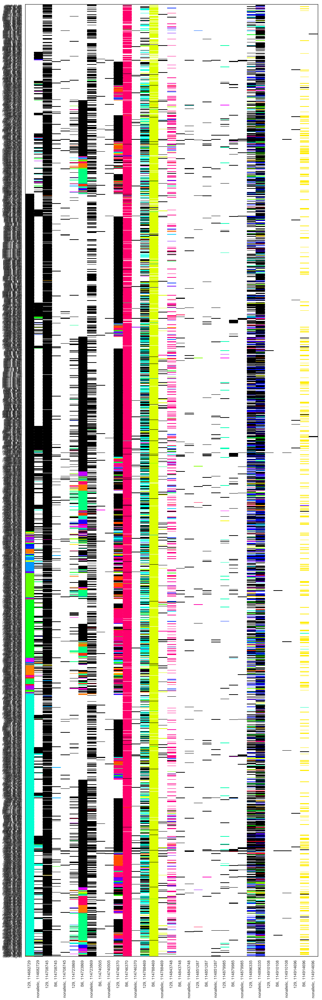

In [146]:
# all cells, all gastruloids, with nonallelic
# lower percentage threshold
fig, ax = plt.subplots(1, figsize=(15,50))
columnsCount = df_targetsites_55.shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites_55.iterrows()):
    for columnIndex,column in enumerate(df_targetsites_55.columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color = scarColors_55[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites_55.shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites_55.shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites_55.columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites_55.columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites_55.index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites_55.index)],fontsize=6.5)

#plt.savefig('./allcells_allgastruloids.png', dpi=300)
plt.show()



In [35]:
# to check which gastruloids are present in the dataset
heatmap.index.levels[0]

Index(['C5A9', 'C5B10', 'C5C6', 'C5F10', 'C5G7', 'C5H11', 'C5H7', 'C5H9'], dtype='object', name='gastruloid')

In [147]:
# define color set coupled to scars per gastruloid

cmap = plt.get_cmap('hsv')

#C5A9
scarsC5A9 = set()
for i,r in df_targetsites.loc['C5A9'].iterrows():
    scarsC5A9.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5A9 = { scar: cmap(x) for scar, x in zip(scarsC5A9, np.linspace(0,1, len(scarsC5A9))) }
scarColorsC5A9['WT'] = (0,0,0)

#C5B10
scarsC5B10 = set()
for i,r in df_targetsites.loc['C5B10'].iterrows():
    scarsC5B10.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5B10 = { scar: cmap(x) for scar, x in zip(scarsC5B10, np.linspace(0,1, len(scarsC5B10))) }
scarColorsC5B10['WT'] = (0,0,0)

#C5C6
scarsC5C6 = set()
for i,r in df_targetsites.loc['C5C6'].iterrows():
    scarsC5C6.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5C6 = { scar: cmap(x) for scar, x in zip(scarsC5C6, np.linspace(0,1, len(scarsC5C6))) }
scarColorsC5C6['WT'] = (0,0,0)

#C5F10
scarsC5F10 = set()
for i,r in df_targetsites.loc['C5F10'].iterrows():
    scarsC5F10.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5F10 = { scar: cmap(x) for scar, x in zip(scarsC5F10, np.linspace(0,1, len(scarsC5F10))) }
scarColorsC5F10['WT'] = (0,0,0)

#C5G7
scarsC5G7 = set()
for i,r in df_targetsites.loc['C5G7'].iterrows():
    scarsC5G7.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5G7 = { scar: cmap(x) for scar, x in zip(scarsC5G7, np.linspace(0,1, len(scarsC5G7))) }
scarColorsC5G7['WT'] = (0,0,0)

#C5H11
scarsC5H11 = set()
for i,r in df_targetsites.loc['C5H11'].iterrows():
    scarsC5H11.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5H11 = { scar: cmap(x) for scar, x in zip(scarsC5H11, np.linspace(0,1, len(scarsC5H11))) }
scarColorsC5H11['WT'] = (0,0,0)

#C5H7
scarsC5H7 = set()
for i,r in df_targetsites.loc['C5H7'].iterrows():
    scarsC5H7.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5H7 = { scar: cmap(x) for scar, x in zip(scarsC5H7, np.linspace(0,1, len(scarsC5H7))) }
scarColorsC5H7['WT'] = (0,0,0)

#C5H9
scarsC5H9 = set()
for i,r in df_targetsites.loc['C5H9'].iterrows():
    scarsC5H9.update( set( [x for x in r.unique() if not pd.isnull(x)]) )
scarColorsC5H9 = { scar: cmap(x) for scar, x in zip(scarsC5H9, np.linspace(0,1, len(scarsC5H9))) }
scarColorsC5H9['WT'] = (0,0,0)

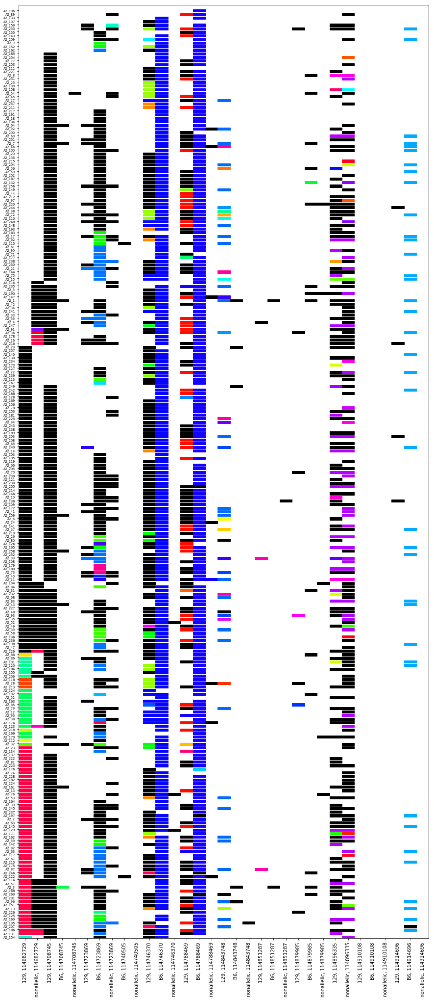

In [26]:
#C5A9
fig, ax = plt.subplots(1, figsize=(15,35))
columnsCount = df_targetsites.loc['C5A9'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5A9'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5A9'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5A9[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5A9'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5A9'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5A9'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5A9'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5A9'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5A9'].index)],fontsize=6.5)

#plt.savefig('./C5A9.png', dpi=300)
plt.show()


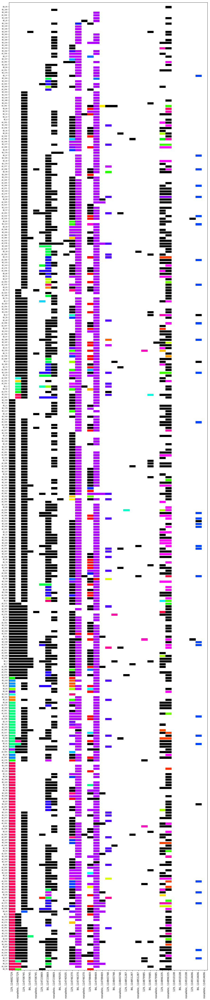

In [27]:
#C5B10
fig, ax = plt.subplots(1, figsize=(15,75))
columnsCount = df_targetsites.loc['C5B10'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5B10'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5B10'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5B10[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5B10'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5B10'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5B10'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5B10'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5B10'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5B10'].index)],fontsize=6.5)

plt.savefig('./C5B10.png', dpi=300)
plt.show()


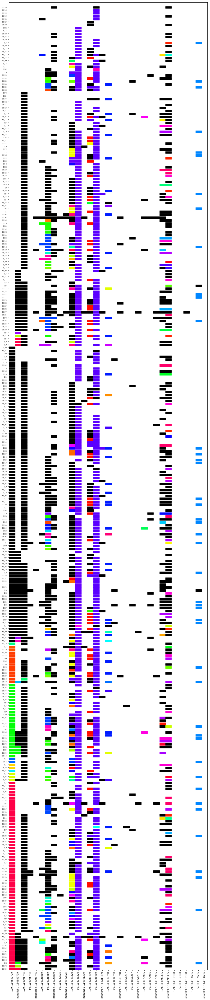

In [36]:
#C5C6
fig, ax = plt.subplots(1, figsize=(15,75))
columnsCount = df_targetsites.loc['C5C6'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5C6'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5C6'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5C6[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5C6'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5C6'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5C6'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5C6'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5C6'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5C6'].index)],fontsize=6.5)

#plt.savefig('./C5C6.png', dpi=300)
plt.show()

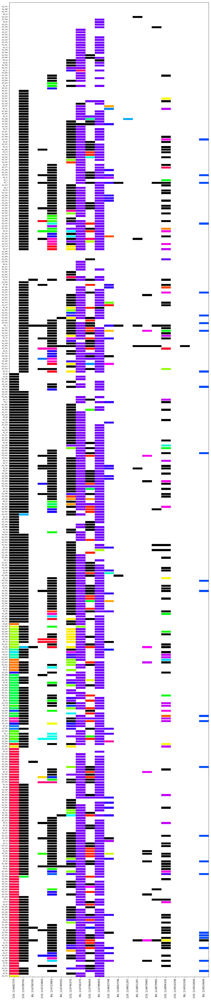

In [37]:
#C5F10 
fig, ax = plt.subplots(1, figsize=(15,75))
columnsCount = df_targetsites2.loc['C5F10'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites2.loc['C5F10'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites2.loc['C5F10'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5F10[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites2.loc['C5F10'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites2.loc['C5F10'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites2.loc['C5F10'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites2.loc['C5F10'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites2.loc['C5F10'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites2.loc['C5F10'].index)],fontsize=6.5)

#plt.savefig('./C5F10.png', dpi=300)
plt.show()

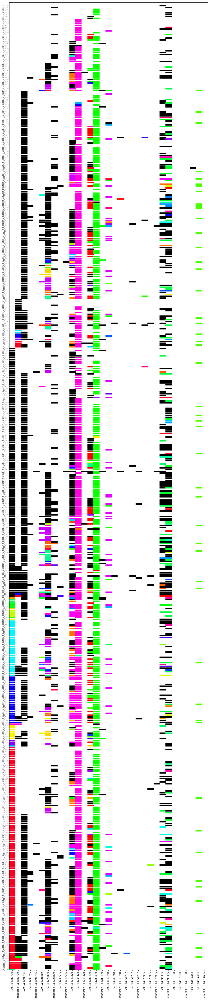

In [38]:
#C5G7
fig, ax = plt.subplots(1, figsize=(15,75))
columnsCount = df_targetsites.loc['C5G7'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5G7'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5G7'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5G7[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5G7'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5G7'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5G7'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5G7'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5G7'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5G7'].index)],fontsize=6.5)

plt.savefig('./C5G7.png', dpi=300)
plt.show()

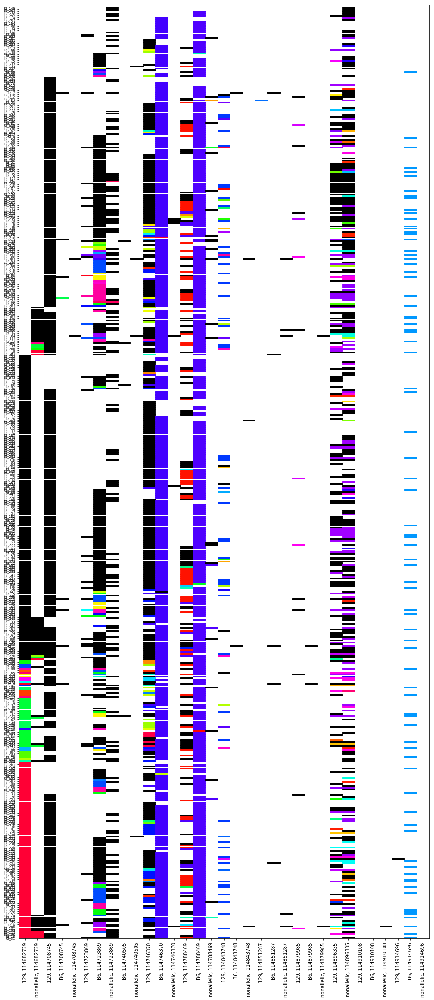

In [39]:
#C5H11
fig, ax = plt.subplots(1, figsize=(15,35))
columnsCount = df_targetsites.loc['C5H11'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5H11'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5H11'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5H11[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5H11'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5H11'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5H11'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5H11'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5H11'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5H11'].index)],fontsize=6.5)

#plt.savefig('./C5H11.png', dpi=300)
plt.show()

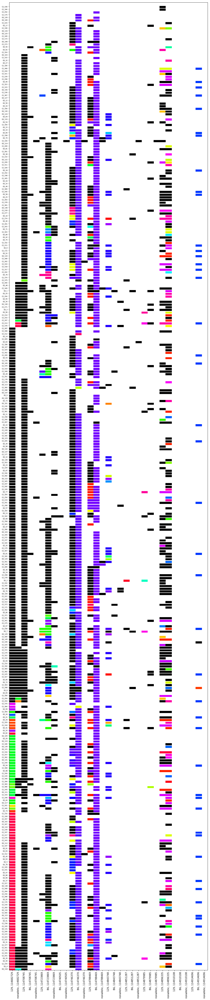

In [40]:
#C5H7
fig, ax = plt.subplots(1, figsize=(15,75))
columnsCount = df_targetsites.loc['C5H7'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5H7'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5H7'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5H7[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5H7'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5H7'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5H7'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5H7'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5H7'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5H7'].index)],fontsize=6.5)

#plt.savefig('./C5H7.png', dpi=300)
plt.show()

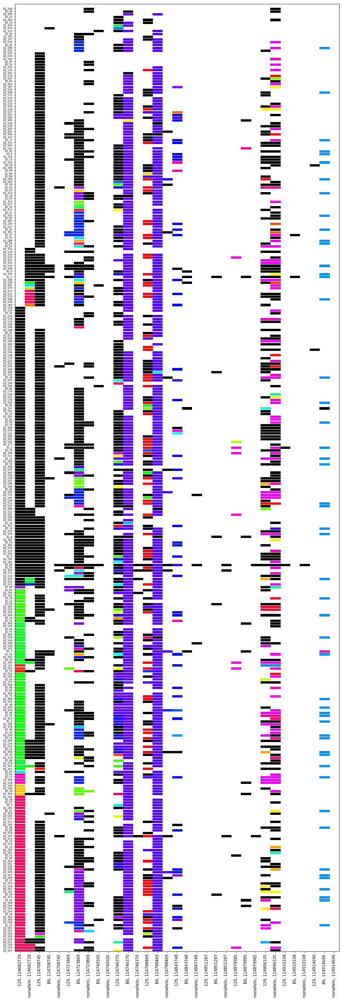

In [41]:
#C5H9
fig, ax = plt.subplots(1, figsize=(15,45))
columnsCount = df_targetsites.loc['C5H9'].shape[1]

rowHeight = 1
rowColwidth = 1
rowSpacing = 0.3

for cellIndex, (cellName, row) in enumerate(df_targetsites.loc['C5H9'].iterrows()):
    for columnIndex,column in enumerate(df_targetsites.loc['C5H9'].columns):
        
        scarForThisCell = row[column]
        if not pd.isnull(scarForThisCell):
            ax.add_patch(
            matplotlib.patches.Rectangle(
                (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                rowColwidth, rowHeight-rowSpacing, color= scarColorsC5H9[scarForThisCell])
            )

ax.set_ylim(0,rowHeight*(df_targetsites.loc['C5H9'].shape[0]+1))
ax.set_xlim(0,rowColwidth*(df_targetsites.loc['C5H9'].shape[1]))

ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df_targetsites.loc['C5H9'].columns)])
ax.set_xticklabels([column for columnIndex,column in enumerate(df_targetsites.loc['C5H9'].columns)],rotation=90)

ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df_targetsites.loc['C5H9'].index)])
ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df_targetsites.loc['C5H9'].index)],fontsize=6.5)

#plt.savefig('./C5H9.png', dpi=300)
plt.show()

# Clustering using Information Weighted Sparse Sample Distance (IWSS)

In [22]:
#to load dataframes for distance calculation again
all_allelecounts_fordistancecalc = pd.read_pickle('VAN2988_all_allelecounts_fordistancecalc.pickle.gz')
allelecountsNA_ts = pd.read_pickle('VAN2988_allelecountsNA_ts.pickle.gz')
allelecountsB6_ts = pd.read_pickle('VAN2988_allelecountsB6_ts.pickle.gz')
allelecounts129_ts = pd.read_pickle('VAN2988_allelecounts129_ts.pickle.gz')

In [23]:
all_allelecounts_fordistancecalc.columns.levels[0]

Index(['C5A9', 'C5B10', 'C5C6', 'C5F10', 'C5G7', 'C5H11', 'C5H7', 'C5H9'], dtype='object')

In [24]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

allelecountsC5A9 = all_allelecounts_fordistancecalc['C5A9'].fillna(0).transpose()
allelecountsC5B10 = all_allelecounts_fordistancecalc['C5B10'].fillna(0).transpose()
allelecountsC5C6 = all_allelecounts_fordistancecalc['C5C6'].fillna(0).transpose()
allelecountsC5F10 = all_allelecounts_fordistancecalc['C5F10'].fillna(0).transpose()
allelecountsC5G7 = all_allelecounts_fordistancecalc['C5G7'].fillna(0).transpose()
allelecountsC5H11 = all_allelecounts_fordistancecalc['C5H11'].fillna(0).transpose()
allelecountsC5H7 = all_allelecounts_fordistancecalc['C5H7'].fillna(0).transpose()
allelecountsC5H9 = all_allelecounts_fordistancecalc['C5H9'].fillna(0).transpose()
all_allelecounts = all_allelecounts_fordistancecalc.fillna(0).transpose()


In [25]:
# to check scars only, no WT counts
all_allelecounts_noWT = all_allelecounts[all_allelecounts.columns.drop(list(all_allelecounts.filter(regex='WT')))]

Text(0, 0.5, 'Number of cells')

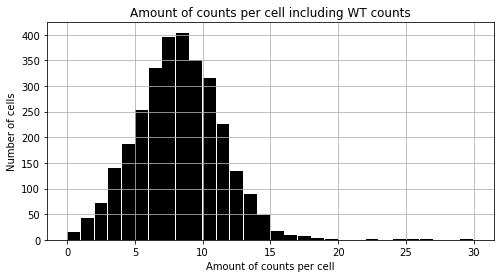

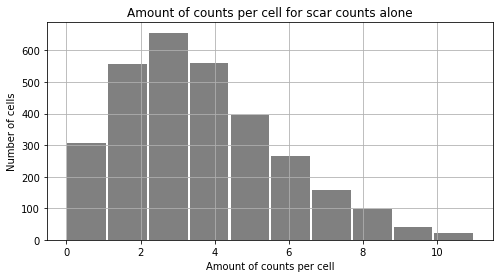

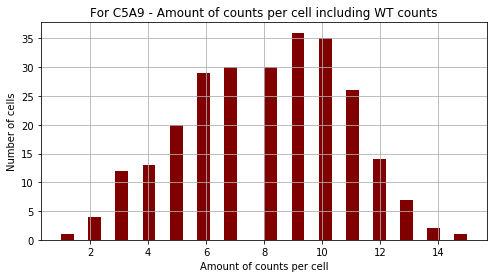

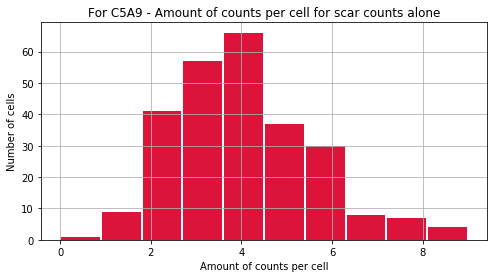

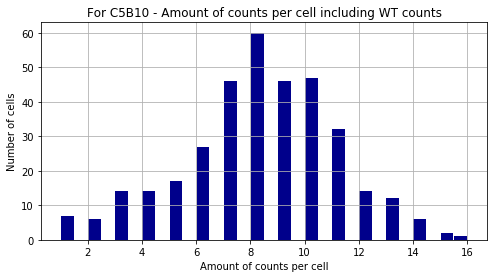

...

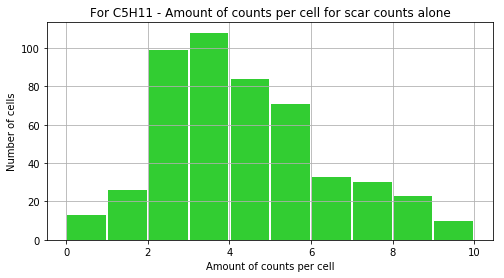

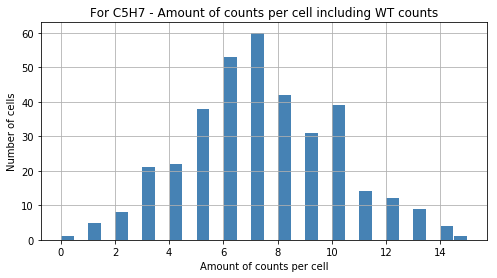

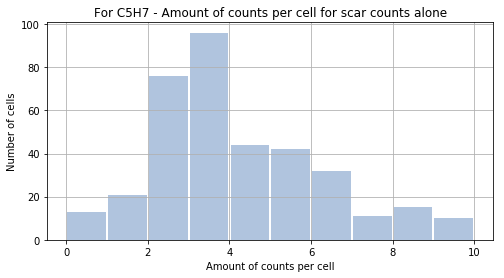

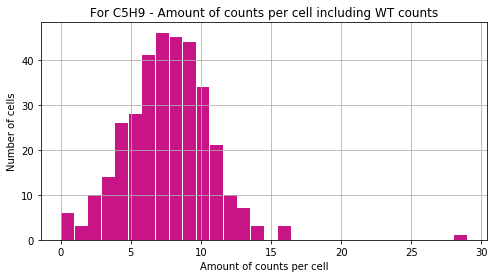

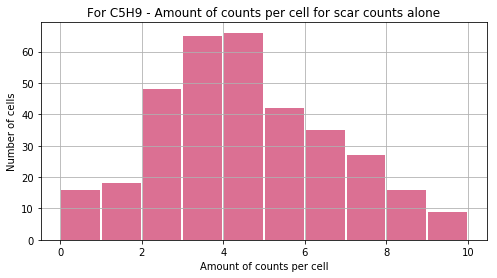

In [26]:
## plot the amount of counts per cell, for the total dataset and separated for each gastruloid.
# two plots are produced, one with the total counts per cell (wt + scar), and one counting scars only.

#for all
#sns.set_style('darkgrid')
plt.figure(figsize=(8,4))
all_allelecounts.sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='black')
plt.xlabel('Amount of counts per cell')
plt.title('Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='gray')
plt.xlabel('Amount of counts per cell')
plt.title('Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

#for C5A9
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5A9'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='maroon')
plt.xlabel('Amount of counts per cell')
plt.title('For C5A9 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5A9'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='crimson')
plt.xlabel('Amount of counts per cell')
plt.title('For C5A9 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5B10
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5B10'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='darkblue')
plt.xlabel('Amount of counts per cell')
plt.title('For C5B10 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5B10'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='dodgerblue')
plt.xlabel('Amount of counts per cell')
plt.title('For C5B10 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5C6
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5C6'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='seagreen')
plt.xlabel('Amount of counts per cell')
plt.title('For C5C6 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5C6'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='palegreen')
plt.xlabel('Amount of counts per cell')
plt.title('For C5C6 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5F10
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5F10'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='orangered')
plt.xlabel('Amount of counts per cell')
plt.title('For C5F10 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5F10'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='coral')
plt.xlabel('Amount of counts per cell')
plt.title('For C5F10 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5F10
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5F10'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='tomato')
plt.xlabel('Amount of counts per cell')
plt.title('For C5F10 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5F10'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='salmon')
plt.xlabel('Amount of counts per cell')
plt.title('For C5F10 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5G7
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5G7'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='darkmagenta')
plt.xlabel('Amount of counts per cell')
plt.title('For C5G7 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5G7'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='orchid')
plt.xlabel('Amount of counts per cell')
plt.title('For C5G7 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5H11
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5H11'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='forestgreen')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H11 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5H11'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='limegreen')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H11 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5H7
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5H7'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='steelblue')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H7 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5H7'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='lightsteelblue')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H7 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

#for C5H9
plt.figure(figsize=(8,4))
all_allelecounts.loc['C5H9'].sum(axis=1).plot.hist(grid=True, bins=30, rwidth=0.95,color='mediumvioletred')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H9 - Amount of counts per cell including WT counts')
plt.ylabel('Number of cells')

plt.figure(figsize=(8,4))
all_allelecounts_noWT.loc['C5H9'].sum(axis=1).plot.hist(grid=True, bins=10, rwidth=0.95,color='palevioletred')
plt.xlabel('Amount of counts per cell')
plt.title('For C5H9 - Amount of counts per cell for scar counts alone')
plt.ylabel('Number of cells')

In [27]:
#this filters out cells with less than n counts
filtered_all_allelecounts = collections.defaultdict(dict)
for cell in all_allelecounts.index:
    if all_allelecounts.loc[cell].sum() >= 4:
        filtered_all_allelecounts[cell] = all_allelecounts.loc[cell]
filtered_all_allelecountsPD = pd.DataFrame.from_dict(filtered_all_allelecounts).transpose()

filter_allelecountsC5A9 = filtered_all_allelecountsPD.loc['C5A9'].fillna(0)
filter_allelecountsC5B10 = filtered_all_allelecountsPD.loc['C5B10'].fillna(0)
filter_allelecountsC5C6 = filtered_all_allelecountsPD.loc['C5C6'].fillna(0)
filter_allelecountsC5F10 = filtered_all_allelecountsPD.loc['C5F10'].fillna(0)
filter_allelecountsC5G7 = filtered_all_allelecountsPD.loc['C5G7'].fillna(0)
filter_allelecountsC5H11 = filtered_all_allelecountsPD.loc['C5H11'].fillna(0)
filter_allelecountsC5H7 = filtered_all_allelecountsPD.loc['C5H7'].fillna(0)
filter_allelecountsC5H9 = filtered_all_allelecountsPD.loc['C5H9'].fillna(0)
filter_all_allelecounts = filtered_all_allelecountsPD.fillna(0).transpose()

# Distance clustering step by step

In [28]:
# for C5F10
rawMatrix = filter_allelecountsC5F10.values 

rawMatrix = rawMatrix[:, np.logical_and( 
    np.sum(rawMatrix==0,axis=0)>0,
    np.sum(rawMatrix==1,axis=0)>0
)]

pOnes = []
pZeros = []
for i in range(rawMatrix.shape[1]):
    # Weights:
    column = rawMatrix[:,i]
    pOnes.append( -np.log2( ( np.sum(column==1)/len(column) )**2 ) ) #probability of two cells both having sSNV
    pZeros.append( -np.log2( ( np.sum(column==0)/len(column) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes = np.array(pOnes)
pZeros = np.array(pZeros)

In [29]:
#For C5F10
print( np.sum( np.logical_not(np.isfinite(pZeros)) ),  np.sum((np.isfinite(pZeros))))
print( np.sum( np.logical_not(np.isfinite(pOnes)) ),  np.sum((np.isfinite(pOnes))))
print(rawMatrix.shape)

0 160
0 160
(367, 160)


In [30]:
# for C5F10
jointMatrix = np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
simMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
differenceMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )

for cai in range(rawMatrix.shape[0]):
    for cbi in range(rawMatrix.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance = np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==0 ) * \
        (pOnes + pZeros) + \
        np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==1 ) * (pZeros + pOnes) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor = np.sum( pOnes* (rawMatrix[cai,:]==1)) + np.sum( pZeros*(rawMatrix[cai,:]==0)) + \
                        np.sum( pOnes* (rawMatrix[cbi,:]==1)) + np.sum( pZeros* (rawMatrix[cbi,:]==0))

        pairwiseNormalizedDistance = np.sum(pairwiseUnnormalizedDistance) / (
                        normalisationFactor )
        differenceMatrix[cai, cbi] = pairwiseNormalizedDistance

                # Similarity calculation:
        sim = np.sum( (pOnes+pOnes) * np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==1 )) + \
                      np.sum( (pZeros+pZeros)*np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==0 ))

        normalisedSim = sim/normalisationFactor
        simMatrix[cai, cbi] = normalisedSim

        joinedDistance =  pairwiseNormalizedDistance + (1-normalisedSim )
        jointMatrix[cai,cbi]= joinedDistance


        if cai==cbi:
            break

In [31]:
# for C5F10
print(pairwiseNormalizedDistance, normalisedSim)
joinedDistance

0.0 1.0


0.0

In [34]:
# for C5F10
normalisedSim, normalisationFactor, sim, rawMatrix[cai,rawMatrix[cai,:]>=0], rawMatrix[cbi,rawMatrix[cbi,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix ) ) ))
rawMatrix[ np.where( np.logical_not( np.isfinite( jointMatrix ) ) )[0][0] ]

(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [35]:
# for C5F10
for i in range(jointMatrix.shape[0]):
    for j in range(jointMatrix.shape[0]):
        jointMatrix[j,i]=jointMatrix[i,j]
        if i==j:
            break


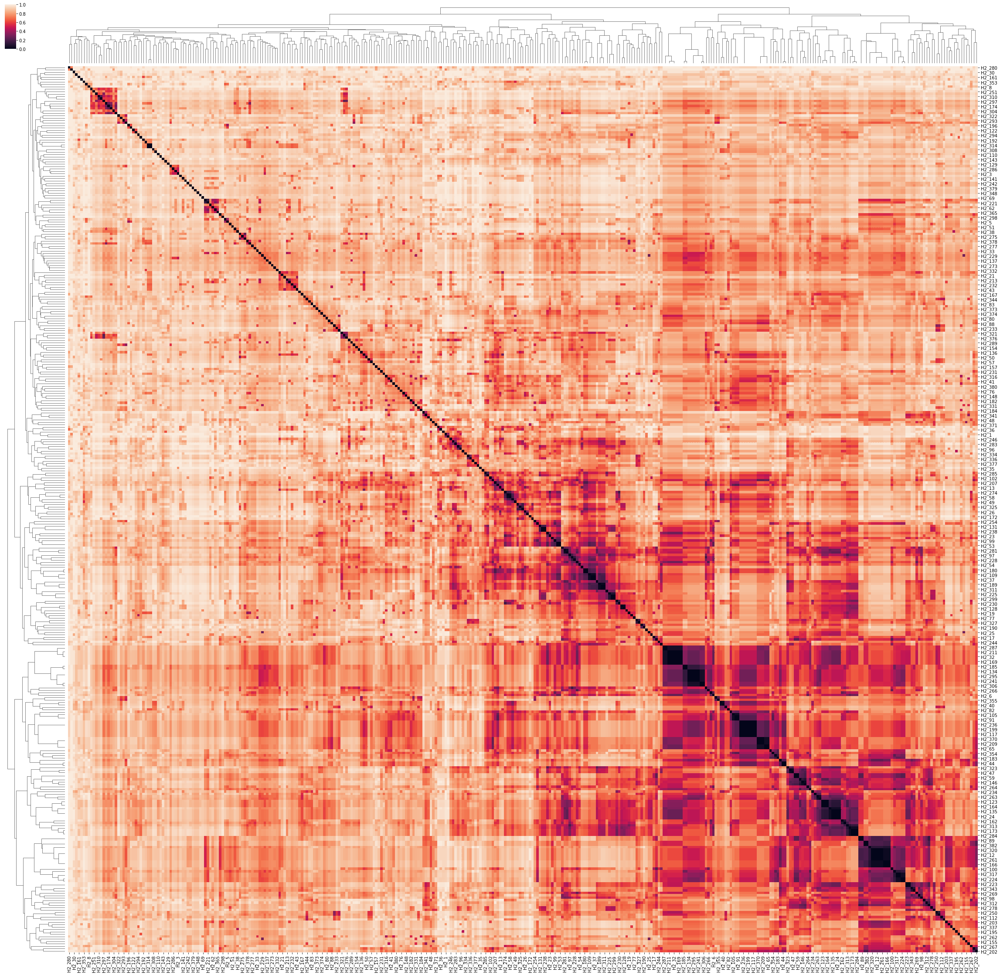

In [36]:
# for C5F10, filtered to include only cells with >4 counts
#fig, ax = plt.subplots(1,1, figsize=(30,30))
df = pd.DataFrame( np.log(jointMatrix+1), index=filter_allelecountsC5F10.index, columns=filter_allelecountsC5F10.index )
sns.clustermap( df, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
#.savefig('heatmapC5F10.png',dpi=300)

In [ ]:
# Produce tables

In [ ]:
x = scipy.cluster.hierarchy.linkage(df.fillna(0),'ward')
clusters = scipy.cluster.hierarchy.cut_tree(x, n_clusters=40)

In [ ]:
C5F10_40clust = pd.DataFrame.from_dict({cellName:{'cluster':clusters[cellIndex][0]} for cellIndex,cellName in enumerate(df.index)}).transpose()
C5F10_40clust.to_csv('/Users/m.blotenburg/Documents/Projects/Mouse Scartrace/Scar analysis/Scarsclust_MF/C5F10_40clust_ward.csv')

In [ ]:
C5F10_40clust['cluster'].unique()

In [ ]:
order = scipy.cluster.hierarchy.leaves_list(scipy.cluster.hierarchy.linkage(df.fillna(0),method='single', metric='euclidean'))

ordereddf = df.iloc[order]

In [ ]:
test = scipy.cluster.hierarchy.linkage(df.fillna(0), 'ward')

# Distance matrix for all gastruloids

In [37]:
#Calculate raw matrix per gastruloid

### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

# For C5F10
rawMatrix_C5F10 = filter_allelecountsC5F10.values 

rawMatrix_C5F10 = rawMatrix_C5F10[:, np.logical_and( 
    np.sum(rawMatrix_C5F10==0,axis=0)>0,
    np.sum(rawMatrix_C5F10==1,axis=0)>0
)]

pOnes_C5F10 = []
pZeros_C5F10 = []
for i in range(rawMatrix_C5F10.shape[1]):
    # Weights:
    column_C5F10 = rawMatrix_C5F10[:,i]
    pOnes_C5F10.append( -np.log2( ( np.sum(column_C5F10==1)/len(column_C5F10) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5F10.append( -np.log2( ( np.sum(column_C5F10==0)/len(column_C5F10) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5F10 = np.array(pOnes_C5F10)
pZeros_C5F10 = np.array(pZeros_C5F10)

# For C5A9
rawMatrix_C5A9 = filter_allelecountsC5A9.values 

rawMatrix_C5A9 = rawMatrix_C5A9[:, np.logical_and( 
    np.sum(rawMatrix_C5A9==0,axis=0)>0,
    np.sum(rawMatrix_C5A9==1,axis=0)>0
)]

pOnes_C5A9 = []
pZeros_C5A9 = []
for i in range(rawMatrix_C5A9.shape[1]):
    # Weights:
    column_C5A9 = rawMatrix_C5A9[:,i]
    pOnes_C5A9.append( -np.log2( ( np.sum(column_C5A9==1)/len(column_C5A9) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5A9.append( -np.log2( ( np.sum(column_C5A9==0)/len(column_C5A9) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5A9 = np.array(pOnes_C5A9)
pZeros_C5A9 = np.array(pZeros_C5A9)


# For C5B10
rawMatrix_C5B10 = filter_allelecountsC5B10.values 

rawMatrix_C5B10 = rawMatrix_C5B10[:, np.logical_and( 
    np.sum(rawMatrix_C5B10==0,axis=0)>0,
    np.sum(rawMatrix_C5B10==1,axis=0)>0
)]

pOnes_C5B10 = []
pZeros_C5B10 = []
for i in range(rawMatrix_C5B10.shape[1]):
    # Weights:
    column_C5B10 = rawMatrix_C5B10[:,i]
    pOnes_C5B10.append( -np.log2( ( np.sum(column_C5B10==1)/len(column_C5B10) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5B10.append( -np.log2( ( np.sum(column_C5B10==0)/len(column_C5B10) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5B10 = np.array(pOnes_C5B10)
pZeros_C5B10 = np.array(pZeros_C5B10)


# For C5C6
rawMatrix_C5C6 = filter_allelecountsC5C6.values 

rawMatrix_C5C6 = rawMatrix_C5C6[:, np.logical_and( 
    np.sum(rawMatrix_C5C6==0,axis=0)>0,
    np.sum(rawMatrix_C5C6==1,axis=0)>0
)]

pOnes_C5C6 = []
pZeros_C5C6 = []
for i in range(rawMatrix_C5C6.shape[1]):
    # Weights:
    column_C5C6 = rawMatrix_C5C6[:,i]
    pOnes_C5C6.append( -np.log2( ( np.sum(column_C5C6==1)/len(column_C5C6) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5C6.append( -np.log2( ( np.sum(column_C5C6==0)/len(column_C5C6) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5C6 = np.array(pOnes_C5C6)
pZeros_C5C6 = np.array(pZeros_C5C6)



# For C5G7
rawMatrix_C5G7 = filter_allelecountsC5G7.values 

rawMatrix_C5G7 = rawMatrix_C5G7[:, np.logical_and( 
    np.sum(rawMatrix_C5G7==0,axis=0)>0,
    np.sum(rawMatrix_C5G7==1,axis=0)>0
)]

pOnes_C5G7 = []
pZeros_C5G7 = []
for i in range(rawMatrix_C5G7.shape[1]):
    # Weights:
    column_C5G7 = rawMatrix_C5G7[:,i]
    pOnes_C5G7.append( -np.log2( ( np.sum(column_C5G7==1)/len(column_C5G7) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5G7.append( -np.log2( ( np.sum(column_C5G7==0)/len(column_C5G7) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5G7 = np.array(pOnes_C5G7)
pZeros_C5G7 = np.array(pZeros_C5G7)



# For C5H11 
rawMatrix_C5H11 = filter_allelecountsC5H11.values 

rawMatrix_C5H11 = rawMatrix_C5H11[:, np.logical_and( 
    np.sum(rawMatrix_C5H11==0,axis=0)>0,
    np.sum(rawMatrix_C5H11==1,axis=0)>0
)]

pOnes_C5H11 = []
pZeros_C5H11 = []
for i in range(rawMatrix_C5H11.shape[1]):
    # Weights:
    column_C5H11 = rawMatrix_C5H11[:,i]
    pOnes_C5H11.append( -np.log2( ( np.sum(column_C5H11==1)/len(column_C5H11) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5H11.append( -np.log2( ( np.sum(column_C5H11==0)/len(column_C5H11) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5H11 = np.array(pOnes_C5H11)
pZeros_C5H11 = np.array(pZeros_C5H11)


# For C5H7
rawMatrix_C5H7 = filter_allelecountsC5H7.values 

rawMatrix_C5H7 = rawMatrix_C5H7[:, np.logical_and( 
    np.sum(rawMatrix_C5H7==0,axis=0)>0,
    np.sum(rawMatrix_C5H7==1,axis=0)>0
)]

pOnes_C5H7 = []
pZeros_C5H7 = []
for i in range(rawMatrix_C5H7.shape[1]):
    # Weights:
    column_C5H7 = rawMatrix_C5H7[:,i]
    pOnes_C5H7.append( -np.log2( ( np.sum(column_C5H7==1)/len(column_C5H7) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5H7.append( -np.log2( ( np.sum(column_C5H7==0)/len(column_C5H7) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5H7 = np.array(pOnes_C5H7)
pZeros_C5H7 = np.array(pZeros_C5H7)


# For C5H9 
rawMatrix_C5H9 = filter_allelecountsC5H9.values 

rawMatrix_C5H9 = rawMatrix_C5H9[:, np.logical_and( 
    np.sum(rawMatrix_C5H9==0,axis=0)>0,
    np.sum(rawMatrix_C5H9==1,axis=0)>0
)]

pOnes_C5H9 = []
pZeros_C5H9 = []
for i in range(rawMatrix_C5H9.shape[1]):
    # Weights:
    column_C5H9 = rawMatrix_C5H9[:,i]
    pOnes_C5H9.append( -np.log2( ( np.sum(column_C5H9==1)/len(column_C5H9) )**2 ) ) #probability of two cells both having sSNV
    pZeros_C5H9.append( -np.log2( ( np.sum(column_C5H9==0)/len(column_C5H9) )**2 ) )#probability of two cells not having sSNV,  (and we know it)

pOnes_C5H9 = np.array(pOnes_C5H9)
pZeros_C5H9 = np.array(pZeros_C5H9)


In [38]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

# for C5F10
print('C5F10')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5F10)) ),  np.sum((np.isfinite(pZeros_C5F10))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5F10)) ),  np.sum((np.isfinite(pOnes_C5F10))))
print(rawMatrix_C5F10.shape)

# For C5A9
print('C5A9')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5A9)) ),  np.sum((np.isfinite(pZeros_C5A9))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5A9)) ),  np.sum((np.isfinite(pOnes_C5A9))))
print(rawMatrix_C5A9.shape)

# For C5B10
print('C5B10')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5B10)) ),  np.sum((np.isfinite(pZeros_C5B10))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5B10)) ),  np.sum((np.isfinite(pOnes_C5B10))))
print(rawMatrix_C5B10.shape)

# For C5C6
print('C5C6')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5C6)) ),  np.sum((np.isfinite(pZeros_C5C6))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5C6)) ),  np.sum((np.isfinite(pOnes_C5C6))))
print(rawMatrix_C5C6.shape)

# For C5G7
print('C5G7')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5G7)) ),  np.sum((np.isfinite(pZeros_C5G7))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5G7)) ),  np.sum((np.isfinite(pOnes_C5G7))))
print(rawMatrix_C5G7.shape)

# For C5H11 
print('C5H11')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5H11)) ),  np.sum((np.isfinite(pZeros_C5H11))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5H11)) ),  np.sum((np.isfinite(pOnes_C5H11))))
print(rawMatrix_C5H11.shape)

# For C5H7
print('C5A9')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5A9)) ),  np.sum((np.isfinite(pZeros_C5A9))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5A9)) ),  np.sum((np.isfinite(pOnes_C5A9))))
print(rawMatrix_C5A9.shape)

# For C5H9 
print('C5H9')
print( np.sum( np.logical_not(np.isfinite(pZeros_C5H9)) ),  np.sum((np.isfinite(pZeros_C5H9))))
print( np.sum( np.logical_not(np.isfinite(pOnes_C5H9)) ),  np.sum((np.isfinite(pOnes_C5H9))))
print(rawMatrix_C5H9.shape)



C5F10
0 160
0 160
(367, 160)
C5A9
0 113
0 113
(243, 113)
C5B10
0 133
0 133
(324, 133)
C5C6
0 148
0 148
(299, 148)
C5G7
0 201
0 201
(462, 201)
C5H11
0 165
0 165
(456, 165)
C5A9
0 113
0 113
(243, 113)
C5H9
0 140
0 140
(309, 140)


In [ ]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

# for C5F10
jointMatrix_C5F10 = np.zeros( (rawMatrix_C5F10.shape[0], rawMatrix_C5F10.shape[0]) )
simMatrix_C5F10 =  np.zeros( (rawMatrix_C5F10.shape[0], rawMatrix_C5F10.shape[0]) )
differenceMatrix_C5F10 =  np.zeros( (rawMatrix_C5F10.shape[0], rawMatrix_C5F10.shape[0]) )

for cai_C5F10 in range(rawMatrix_C5F10.shape[0]):
    for cbi_C5F10 in range(rawMatrix_C5F10.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5F10 = np.logical_and( rawMatrix_C5F10[cai_C5F10,:]==1, rawMatrix_C5F10[cbi_C5F10,:]==0 ) * \
        (pOnes_C5F10 + pZeros_C5F10) + \
        np.logical_and( rawMatrix_C5F10[cai_C5F10,:]==0, rawMatrix_C5F10[cbi_C5F10,:]==1 ) * (pZeros_C5F10 + pOnes_C5F10) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5F10 = np.sum( pOnes_C5F10 * (rawMatrix_C5F10[cai_C5F10,:]==1)) + np.sum( pZeros_C5F10*(rawMatrix_C5F10[cai_C5F10,:]==0)) + \
                        np.sum( pOnes_C5F10* (rawMatrix_C5F10[cbi_C5F10,:]==1)) + np.sum( pZeros_C5F10* (rawMatrix_C5F10[cbi_C5F10,:]==0))

        pairwiseNormalizedDistance_C5F10 = np.sum(pairwiseUnnormalizedDistance_C5F10) / (
                        normalisationFactor_C5F10 )
        differenceMatrix_C5F10[cai_C5F10, cbi_C5F10] = pairwiseNormalizedDistance_C5F10

                # Similarity calculation:
        sim_C5F10 = np.sum( (pOnes_C5F10+pOnes_C5F10) * np.logical_and( rawMatrix_C5F10[cai_C5F10,:]==1, rawMatrix_C5F10[cbi_C5F10,:]==1 )) + \
                      np.sum( (pZeros_C5F10+pZeros_C5F10)*np.logical_and( rawMatrix_C5F10[cai_C5F10,:]==0, rawMatrix_C5F10[cbi_C5F10,:]==0 ))

        normalisedSim_C5F10 = sim_C5F10/normalisationFactor_C5F10
        simMatrix_C5F10[cai_C5F10, cbi_C5F10] = normalisedSim_C5F10

        joinedDistance_C5F10 =  pairwiseNormalizedDistance_C5F10 + (1-normalisedSim_C5F10 )
        jointMatrix_C5F10[cai_C5F10,cbi_C5F10]= joinedDistance_C5F10


        if cai_C5F10==cbi_C5F10:
            break
            
# For C5A9
jointMatrix_C5A9 = np.zeros( (rawMatrix_C5A9.shape[0], rawMatrix_C5A9.shape[0]) )
simMatrix_C5A9 =  np.zeros( (rawMatrix_C5A9.shape[0], rawMatrix_C5A9.shape[0]) )
differenceMatrix_C5A9 =  np.zeros( (rawMatrix_C5A9.shape[0], rawMatrix_C5A9.shape[0]) )

for cai_C5A9 in range(rawMatrix_C5A9.shape[0]):
    for cbi_C5A9 in range(rawMatrix_C5A9.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5A9 = np.logical_and( rawMatrix_C5A9[cai_C5A9,:]==1, rawMatrix_C5A9[cbi_C5A9,:]==0 ) * \
        (pOnes_C5A9 + pZeros_C5A9) + \
        np.logical_and( rawMatrix_C5A9[cai_C5A9,:]==0, rawMatrix_C5A9[cbi_C5A9,:]==1 ) * (pZeros_C5A9 + pOnes_C5A9) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5A9 = np.sum( pOnes_C5A9 * (rawMatrix_C5A9[cai_C5A9,:]==1)) + np.sum( pZeros_C5A9*(rawMatrix_C5A9[cai_C5A9,:]==0)) + \
                        np.sum( pOnes_C5A9* (rawMatrix_C5A9[cbi_C5A9,:]==1)) + np.sum( pZeros_C5A9* (rawMatrix_C5A9[cbi_C5A9,:]==0))

        pairwiseNormalizedDistance_C5A9 = np.sum(pairwiseUnnormalizedDistance_C5A9) / (
                        normalisationFactor_C5A9 )
        differenceMatrix_C5A9[cai_C5A9, cbi_C5A9] = pairwiseNormalizedDistance_C5A9

                # Similarity calculation:
        sim_C5A9 = np.sum( (pOnes_C5A9+pOnes_C5A9) * np.logical_and( rawMatrix_C5A9[cai_C5A9,:]==1, rawMatrix_C5A9[cbi_C5A9,:]==1 )) + \
                      np.sum( (pZeros_C5A9+pZeros_C5A9)*np.logical_and( rawMatrix_C5A9[cai_C5A9,:]==0, rawMatrix_C5A9[cbi_C5A9,:]==0 ))

        normalisedSim_C5A9 = sim_C5A9/normalisationFactor_C5A9
        simMatrix_C5A9[cai_C5A9, cbi_C5A9] = normalisedSim_C5A9

        joinedDistance_C5A9 =  pairwiseNormalizedDistance_C5A9 + (1-normalisedSim_C5A9 )
        jointMatrix_C5A9[cai_C5A9,cbi_C5A9]= joinedDistance_C5A9


        if cai_C5A9==cbi_C5A9:
            break

# For C5B10
jointMatrix_C5B10 = np.zeros( (rawMatrix_C5B10.shape[0], rawMatrix_C5B10.shape[0]) )
simMatrix_C5B10 =  np.zeros( (rawMatrix_C5B10.shape[0], rawMatrix_C5B10.shape[0]) )
differenceMatrix_C5B10 =  np.zeros( (rawMatrix_C5B10.shape[0], rawMatrix_C5B10.shape[0]) )

for cai_C5B10 in range(rawMatrix_C5B10.shape[0]):
    for cbi_C5B10 in range(rawMatrix_C5B10.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5B10 = np.logical_and( rawMatrix_C5B10[cai_C5B10,:]==1, rawMatrix_C5B10[cbi_C5B10,:]==0 ) * \
        (pOnes_C5B10 + pZeros_C5B10) + \
        np.logical_and( rawMatrix_C5B10[cai_C5B10,:]==0, rawMatrix_C5B10[cbi_C5B10,:]==1 ) * (pZeros_C5B10 + pOnes_C5B10) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5B10 = np.sum( pOnes_C5B10 * (rawMatrix_C5B10[cai_C5B10,:]==1)) + np.sum( pZeros_C5B10*(rawMatrix_C5B10[cai_C5B10,:]==0)) + \
                        np.sum( pOnes_C5B10* (rawMatrix_C5B10[cbi_C5B10,:]==1)) + np.sum( pZeros_C5B10* (rawMatrix_C5B10[cbi_C5B10,:]==0))

        pairwiseNormalizedDistance_C5B10 = np.sum(pairwiseUnnormalizedDistance_C5B10) / (
                        normalisationFactor_C5B10 )
        differenceMatrix_C5B10[cai_C5B10, cbi_C5B10] = pairwiseNormalizedDistance_C5B10

                # Similarity calculation:
        sim_C5B10 = np.sum( (pOnes_C5B10+pOnes_C5B10) * np.logical_and( rawMatrix_C5B10[cai_C5B10,:]==1, rawMatrix_C5B10[cbi_C5B10,:]==1 )) + \
                      np.sum( (pZeros_C5B10+pZeros_C5B10)*np.logical_and( rawMatrix_C5B10[cai_C5B10,:]==0, rawMatrix_C5B10[cbi_C5B10,:]==0 ))

        normalisedSim_C5B10 = sim_C5B10/normalisationFactor_C5B10
        simMatrix_C5B10[cai_C5B10, cbi_C5B10] = normalisedSim_C5B10

        joinedDistance_C5B10 =  pairwiseNormalizedDistance_C5B10 + (1-normalisedSim_C5B10 )
        jointMatrix_C5B10[cai_C5B10,cbi_C5B10]= joinedDistance_C5B10


        if cai_C5B10==cbi_C5B10:
            break

# For C5C6
jointMatrix_C5C6 = np.zeros( (rawMatrix_C5C6.shape[0], rawMatrix_C5C6.shape[0]) )
simMatrix_C5C6 =  np.zeros( (rawMatrix_C5C6.shape[0], rawMatrix_C5C6.shape[0]) )
differenceMatrix_C5C6 =  np.zeros( (rawMatrix_C5C6.shape[0], rawMatrix_C5C6.shape[0]) )

for cai_C5C6 in range(rawMatrix_C5C6.shape[0]):
    for cbi_C5C6 in range(rawMatrix_C5C6.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5C6 = np.logical_and( rawMatrix_C5C6[cai_C5C6,:]==1, rawMatrix_C5C6[cbi_C5C6,:]==0 ) * \
        (pOnes_C5C6 + pZeros_C5C6) + \
        np.logical_and( rawMatrix_C5C6[cai_C5C6,:]==0, rawMatrix_C5C6[cbi_C5C6,:]==1 ) * (pZeros_C5C6 + pOnes_C5C6) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5C6 = np.sum( pOnes_C5C6 * (rawMatrix_C5C6[cai_C5C6,:]==1)) + np.sum( pZeros_C5C6*(rawMatrix_C5C6[cai_C5C6,:]==0)) + \
                        np.sum( pOnes_C5C6* (rawMatrix_C5C6[cbi_C5C6,:]==1)) + np.sum( pZeros_C5C6* (rawMatrix_C5C6[cbi_C5C6,:]==0))

        pairwiseNormalizedDistance_C5C6 = np.sum(pairwiseUnnormalizedDistance_C5C6) / (
                        normalisationFactor_C5C6 )
        differenceMatrix_C5C6[cai_C5C6, cbi_C5C6] = pairwiseNormalizedDistance_C5C6

                # Similarity calculation:
        sim_C5C6 = np.sum( (pOnes_C5C6+pOnes_C5C6) * np.logical_and( rawMatrix_C5C6[cai_C5C6,:]==1, rawMatrix_C5C6[cbi_C5C6,:]==1 )) + \
                      np.sum( (pZeros_C5C6+pZeros_C5C6)*np.logical_and( rawMatrix_C5C6[cai_C5C6,:]==0, rawMatrix_C5C6[cbi_C5C6,:]==0 ))

        normalisedSim_C5C6 = sim_C5C6/normalisationFactor_C5C6
        simMatrix_C5C6[cai_C5C6, cbi_C5C6] = normalisedSim_C5C6

        joinedDistance_C5C6 =  pairwiseNormalizedDistance_C5C6 + (1-normalisedSim_C5C6 )
        jointMatrix_C5C6[cai_C5C6,cbi_C5C6]= joinedDistance_C5C6


        if cai_C5C6==cbi_C5C6:
            break

# For C5G7
jointMatrix_C5G7 = np.zeros( (rawMatrix_C5G7.shape[0], rawMatrix_C5G7.shape[0]) )
simMatrix_C5G7 =  np.zeros( (rawMatrix_C5G7.shape[0], rawMatrix_C5G7.shape[0]) )
differenceMatrix_C5G7 =  np.zeros( (rawMatrix_C5G7.shape[0], rawMatrix_C5G7.shape[0]) )

for cai_C5G7 in range(rawMatrix_C5G7.shape[0]):
    for cbi_C5G7 in range(rawMatrix_C5G7.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5G7 = np.logical_and( rawMatrix_C5G7[cai_C5G7,:]==1, rawMatrix_C5G7[cbi_C5G7,:]==0 ) * \
        (pOnes_C5G7 + pZeros_C5G7) + \
        np.logical_and( rawMatrix_C5G7[cai_C5G7,:]==0, rawMatrix_C5G7[cbi_C5G7,:]==1 ) * (pZeros_C5G7 + pOnes_C5G7) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5G7 = np.sum( pOnes_C5G7 * (rawMatrix_C5G7[cai_C5G7,:]==1)) + np.sum( pZeros_C5G7*(rawMatrix_C5G7[cai_C5G7,:]==0)) + \
                        np.sum( pOnes_C5G7* (rawMatrix_C5G7[cbi_C5G7,:]==1)) + np.sum( pZeros_C5G7* (rawMatrix_C5G7[cbi_C5G7,:]==0))

        pairwiseNormalizedDistance_C5G7 = np.sum(pairwiseUnnormalizedDistance_C5G7) / (
                        normalisationFactor_C5G7 )
        differenceMatrix_C5G7[cai_C5G7, cbi_C5G7] = pairwiseNormalizedDistance_C5G7

                # Similarity calculation:
        sim_C5G7 = np.sum( (pOnes_C5G7+pOnes_C5G7) * np.logical_and( rawMatrix_C5G7[cai_C5G7,:]==1, rawMatrix_C5G7[cbi_C5G7,:]==1 )) + \
                      np.sum( (pZeros_C5G7+pZeros_C5G7)*np.logical_and( rawMatrix_C5G7[cai_C5G7,:]==0, rawMatrix_C5G7[cbi_C5G7,:]==0 ))

        normalisedSim_C5G7 = sim_C5G7/normalisationFactor_C5G7
        simMatrix_C5G7[cai_C5G7, cbi_C5G7] = normalisedSim_C5G7

        joinedDistance_C5G7 =  pairwiseNormalizedDistance_C5G7 + (1-normalisedSim_C5G7 )
        jointMatrix_C5G7[cai_C5G7,cbi_C5G7]= joinedDistance_C5G7


        if cai_C5G7==cbi_C5G7:
            break

# For C5H11 
jointMatrix_C5H11 = np.zeros( (rawMatrix_C5H11.shape[0], rawMatrix_C5H11.shape[0]) )
simMatrix_C5H11 =  np.zeros( (rawMatrix_C5H11.shape[0], rawMatrix_C5H11.shape[0]) )
differenceMatrix_C5H11 =  np.zeros( (rawMatrix_C5H11.shape[0], rawMatrix_C5H11.shape[0]) )

for cai_C5H11 in range(rawMatrix_C5H11.shape[0]):
    for cbi_C5H11 in range(rawMatrix_C5H11.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5H11 = np.logical_and( rawMatrix_C5H11[cai_C5H11,:]==1, rawMatrix_C5H11[cbi_C5H11,:]==0 ) * \
        (pOnes_C5H11 + pZeros_C5H11) + \
        np.logical_and( rawMatrix_C5H11[cai_C5H11,:]==0, rawMatrix_C5H11[cbi_C5H11,:]==1 ) * (pZeros_C5H11 + pOnes_C5H11) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5H11 = np.sum( pOnes_C5H11 * (rawMatrix_C5H11[cai_C5H11,:]==1)) + np.sum( pZeros_C5H11*(rawMatrix_C5H11[cai_C5H11,:]==0)) + \
                        np.sum( pOnes_C5H11* (rawMatrix_C5H11[cbi_C5H11,:]==1)) + np.sum( pZeros_C5H11* (rawMatrix_C5H11[cbi_C5H11,:]==0))

        pairwiseNormalizedDistance_C5H11 = np.sum(pairwiseUnnormalizedDistance_C5H11) / (
                        normalisationFactor_C5H11 )
        differenceMatrix_C5H11[cai_C5H11, cbi_C5H11] = pairwiseNormalizedDistance_C5H11

                # Similarity calculation:
        sim_C5H11 = np.sum( (pOnes_C5H11+pOnes_C5H11) * np.logical_and( rawMatrix_C5H11[cai_C5H11,:]==1, rawMatrix_C5H11[cbi_C5H11,:]==1 )) + \
                      np.sum( (pZeros_C5H11+pZeros_C5H11)*np.logical_and( rawMatrix_C5H11[cai_C5H11,:]==0, rawMatrix_C5H11[cbi_C5H11,:]==0 ))

        normalisedSim_C5H11 = sim_C5H11/normalisationFactor_C5H11
        simMatrix_C5H11[cai_C5H11, cbi_C5H11] = normalisedSim_C5H11

        joinedDistance_C5H11 =  pairwiseNormalizedDistance_C5H11 + (1-normalisedSim_C5H11 )
        jointMatrix_C5H11[cai_C5H11,cbi_C5H11]= joinedDistance_C5H11


        if cai_C5H11==cbi_C5H11:
            break

# For C5H7
jointMatrix_C5H7 = np.zeros( (rawMatrix_C5H7.shape[0], rawMatrix_C5H7.shape[0]) )
simMatrix_C5H7 =  np.zeros( (rawMatrix_C5H7.shape[0], rawMatrix_C5H7.shape[0]) )
differenceMatrix_C5H7 =  np.zeros( (rawMatrix_C5H7.shape[0], rawMatrix_C5H7.shape[0]) )

for cai_C5H7 in range(rawMatrix_C5H7.shape[0]):
    for cbi_C5H7 in range(rawMatrix_C5H7.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5H7 = np.logical_and( rawMatrix_C5H7[cai_C5H7,:]==1, rawMatrix_C5H7[cbi_C5H7,:]==0 ) * \
        (pOnes_C5H7 + pZeros_C5H7) + \
        np.logical_and( rawMatrix_C5H7[cai_C5H7,:]==0, rawMatrix_C5H7[cbi_C5H7,:]==1 ) * (pZeros_C5H7 + pOnes_C5H7) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5H7 = np.sum( pOnes_C5H7 * (rawMatrix_C5H7[cai_C5H7,:]==1)) + np.sum( pZeros_C5H7*(rawMatrix_C5H7[cai_C5H7,:]==0)) + \
                        np.sum( pOnes_C5H7* (rawMatrix_C5H7[cbi_C5H7,:]==1)) + np.sum( pZeros_C5H7* (rawMatrix_C5H7[cbi_C5H7,:]==0))

        pairwiseNormalizedDistance_C5H7 = np.sum(pairwiseUnnormalizedDistance_C5H7) / (
                        normalisationFactor_C5H7 )
        differenceMatrix_C5H7[cai_C5H7, cbi_C5H7] = pairwiseNormalizedDistance_C5H7

                # Similarity calculation:
        sim_C5H7 = np.sum( (pOnes_C5H7+pOnes_C5H7) * np.logical_and( rawMatrix_C5H7[cai_C5H7,:]==1, rawMatrix_C5H7[cbi_C5H7,:]==1 )) + \
                      np.sum( (pZeros_C5H7+pZeros_C5H7)*np.logical_and( rawMatrix_C5H7[cai_C5H7,:]==0, rawMatrix_C5H7[cbi_C5H7,:]==0 ))

        normalisedSim_C5H7 = sim_C5H7/normalisationFactor_C5H7
        simMatrix_C5H7[cai_C5H7, cbi_C5H7] = normalisedSim_C5H7

        joinedDistance_C5H7 =  pairwiseNormalizedDistance_C5H7 + (1-normalisedSim_C5H7 )
        jointMatrix_C5H7[cai_C5H7,cbi_C5H7]= joinedDistance_C5H7


        if cai_C5H7==cbi_C5H7:
            break

# For C5H9 
jointMatrix_C5H9 = np.zeros( (rawMatrix_C5H9.shape[0], rawMatrix_C5H9.shape[0]) )
simMatrix_C5H9 =  np.zeros( (rawMatrix_C5H9.shape[0], rawMatrix_C5H9.shape[0]) )
differenceMatrix_C5H9 =  np.zeros( (rawMatrix_C5H9.shape[0], rawMatrix_C5H9.shape[0]) )

for cai_C5H9 in range(rawMatrix_C5H9.shape[0]):
    for cbi_C5H9 in range(rawMatrix_C5H9.shape[0]):
        
                # Un normalized distance
        pairwiseUnnormalizedDistance_C5H9 = np.logical_and( rawMatrix_C5H9[cai_C5H9,:]==1, rawMatrix_C5H9[cbi_C5H9,:]==0 ) * \
        (pOnes_C5H9 + pZeros_C5H9) + \
        np.logical_and( rawMatrix_C5H9[cai_C5H9,:]==0, rawMatrix_C5H9[cbi_C5H9,:]==1 ) * (pZeros_C5H9 + pOnes_C5H9) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
        normalisationFactor_C5H9 = np.sum( pOnes_C5H9 * (rawMatrix_C5H9[cai_C5H9,:]==1)) + np.sum( pZeros_C5H9*(rawMatrix_C5H9[cai_C5H9,:]==0)) + \
                        np.sum( pOnes_C5H9* (rawMatrix_C5H9[cbi_C5H9,:]==1)) + np.sum( pZeros_C5H9* (rawMatrix_C5H9[cbi_C5H9,:]==0))

        pairwiseNormalizedDistance_C5H9 = np.sum(pairwiseUnnormalizedDistance_C5H9) / (
                        normalisationFactor_C5H9 )
        differenceMatrix_C5H9[cai_C5H9, cbi_C5H9] = pairwiseNormalizedDistance_C5H9

                # Similarity calculation:
        sim_C5H9 = np.sum( (pOnes_C5H9+pOnes_C5H9) * np.logical_and( rawMatrix_C5H9[cai_C5H9,:]==1, rawMatrix_C5H9[cbi_C5H9,:]==1 )) + \
                      np.sum( (pZeros_C5H9+pZeros_C5H9)*np.logical_and( rawMatrix_C5H9[cai_C5H9,:]==0, rawMatrix_C5H9[cbi_C5H9,:]==0 ))

        normalisedSim_C5H9 = sim_C5H9/normalisationFactor_C5H9
        simMatrix_C5H9[cai_C5H9, cbi_C5H9] = normalisedSim_C5H9

        joinedDistance_C5H9 =  pairwiseNormalizedDistance_C5H9 + (1-normalisedSim_C5H9 )
        jointMatrix_C5H9[cai_C5H9,cbi_C5H9]= joinedDistance_C5H9


        if cai_C5H9==cbi_C5H9:
            break




In [ ]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

# for C5F10
print('C5F10')
print(pairwiseNormalizedDistance_C5F10, normalisedSim_C5F10)
print(joinedDistance_C5F10)

# For C5A9
print('C5A9')
print(pairwiseNormalizedDistance_C5A9, normalisedSim_C5A9)
print(joinedDistance_C5A9)

# For C5B10
print('C5B10')
print(pairwiseNormalizedDistance_C5B10, normalisedSim_C5B10)
print(joinedDistance_C5B10)

# For C5C6
print('C5C6')
print(pairwiseNormalizedDistance_C5C6, normalisedSim_C5C6)
print(joinedDistance_C5C6)

# For C5G7
print('C5G7')
print(pairwiseNormalizedDistance_C5G7, normalisedSim_C5G7)
print(joinedDistance_C5G7)

# For C5H11 
print('C5H11')
print(pairwiseNormalizedDistance_C5H11, normalisedSim_C5H11)
print(joinedDistance_C5H11)

# For C5H7
print('C5H7')
print(pairwiseNormalizedDistance_C5H7, normalisedSim_C5H7)
print(joinedDistance_C5H7)

# For C5H9 
print('C5H9')
print(pairwiseNormalizedDistance_C5H9, normalisedSim_C5H9)
print(joinedDistance_C5H9)


In [ ]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

# for C5F10
normalisedSim_C5F10, normalisationFactor_C5F10, sim_C5F10, rawMatrix_C5F10[cai_C5F10,rawMatrix_C5F10[cai_C5F10,:]>=0], rawMatrix_C5F10[cbi_C5F10,rawMatrix_C5F10[cbi_C5F10,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5F10 ) ) ))
rawMatrix_C5F10[ np.where( np.logical_not( np.isfinite( jointMatrix_C5F10 ) ) )[0][0] ]


In [256]:
# For C5A9
normalisedSim_C5A9, normalisationFactor_C5A9, sim_C5A9, rawMatrix_C5A9[cai_C5A9,rawMatrix_C5A9[cai_C5A9,:]>=0], rawMatrix_C5A9[cbi_C5A9,rawMatrix_C5A9[cbi_C5A9,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5A9 ) ) ))
rawMatrix_C5A9[ np.where( np.logical_not( np.isfinite( jointMatrix_C5A9 ) ) )[0][0] ]


(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [257]:
# For C5B10
normalisedSim_C5B10, normalisationFactor_C5B10, sim_C5B10, rawMatrix_C5B10[cai_C5B10,rawMatrix_C5B10[cai_C5B10,:]>=0], rawMatrix_C5B10[cbi_C5B10,rawMatrix_C5B10[cbi_C5B10,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5B10 ) ) ))
rawMatrix_C5B10[ np.where( np.logical_not( np.isfinite( jointMatrix_C5B10 ) ) )[0][0] ]


(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [258]:
# For C5C6
normalisedSim_C5C6, normalisationFactor_C5C6, sim_C5C6, rawMatrix_C5C6[cai_C5C6,rawMatrix_C5C6[cai_C5C6,:]>=0], rawMatrix_C5C6[cbi_C5C6,rawMatrix_C5C6[cbi_C5C6,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5C6 ) ) ))
rawMatrix_C5C6[ np.where( np.logical_not( np.isfinite( jointMatrix_C5C6 ) ) )[0][0] ]



(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [259]:
# For C5G7
normalisedSim_C5G7, normalisationFactor_C5G7, sim_C5G7, rawMatrix_C5G7[cai_C5G7,rawMatrix_C5G7[cai_C5G7,:]>=0], rawMatrix_C5G7[cbi_C5G7,rawMatrix_C5G7[cbi_C5G7,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5G7 ) ) ))
rawMatrix_C5G7[ np.where( np.logical_not( np.isfinite( jointMatrix_C5G7 ) ) )[0][0] ]


(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [260]:
# For C5H11 
normalisedSim_C5H11, normalisationFactor_C5H11, sim_C5H11, rawMatrix_C5H11[cai_C5H11,rawMatrix_C5H11[cai_C5H11,:]>=0], rawMatrix_C5H11[cbi_C5H11,rawMatrix_C5H11[cbi_C5H11,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5H11 ) ) ))
rawMatrix_C5H11[ np.where( np.logical_not( np.isfinite( jointMatrix_C5H11 ) ) )[0][0] ]


(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [261]:
# For C5H7
normalisedSim_C5H7, normalisationFactor_C5H7, sim_C5H7, rawMatrix_C5H7[cai_C5H7,rawMatrix_C5H7[cai_C5H7,:]>=0], rawMatrix_C5H7[cbi_C5H7,rawMatrix_C5H7[cbi_C5H7,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5H7 ) ) ))
rawMatrix_C5H7[ np.where( np.logical_not( np.isfinite( jointMatrix_C5H7 ) ) )[0][0] ]


(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [262]:
# For C5H9 
normalisedSim_C5H9, normalisationFactor_C5H9, sim_C5H9, rawMatrix_C5H9[cai_C5H9,rawMatrix_C5H9[cai_C5H9,:]>=0], rawMatrix_C5H9[cbi_C5H9,rawMatrix_C5H9[cbi_C5H9,:]>=0]

print(np.where( np.logical_not( np.isfinite( jointMatrix_C5H9 ) ) ))
rawMatrix_C5H9[ np.where( np.logical_not( np.isfinite( jointMatrix_C5H9 ) ) )[0][0] ]

(array([], dtype=int64), array([], dtype=int64))


IndexError: index 0 is out of bounds for axis 0 with size 0

In [263]:
### all gastruloids from dataset
#'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'
### NOT INCLUDED YET
# 'C5B4', 'C5F2', 'C5G5', 'C5H10', 'C9B8', 'C9C10', 'C9D12', 'C9E10'

# for C5F10
for i in range(jointMatrix_C5F10.shape[0]):
    for j in range(jointMatrix_C5F10.shape[0]):
        jointMatrix_C5F10[j,i]=jointMatrix_C5F10[i,j]
        if i==j:
            break
            
# For C5A9
for i in range(jointMatrix_C5A9.shape[0]):
    for j in range(jointMatrix_C5A9.shape[0]):
        jointMatrix_C5A9[j,i]=jointMatrix_C5A9[i,j]
        if i==j:
            break
            
# For C5B10
for i in range(jointMatrix_C5B10.shape[0]):
    for j in range(jointMatrix_C5B10.shape[0]):
        jointMatrix_C5B10[j,i]=jointMatrix_C5B10[i,j]
        if i==j:
            break
            
# For C5C6
for i in range(jointMatrix_C5C6.shape[0]):
    for j in range(jointMatrix_C5C6.shape[0]):
        jointMatrix_C5C6[j,i]=jointMatrix_C5C6[i,j]
        if i==j:
            break
            
# For C5G7
for i in range(jointMatrix_C5G7.shape[0]):
    for j in range(jointMatrix_C5G7.shape[0]):
        jointMatrix_C5G7[j,i]=jointMatrix_C5G7[i,j]
        if i==j:
            break
            

# For C5H11 
for i in range(jointMatrix_C5H11.shape[0]):
    for j in range(jointMatrix_C5H11.shape[0]):
        jointMatrix_C5H11[j,i]=jointMatrix_C5H11[i,j]
        if i==j:
            break
            

# For C5H7
for i in range(jointMatrix_C5H7.shape[0]):
    for j in range(jointMatrix_C5H7.shape[0]):
        jointMatrix_C5H7[j,i]=jointMatrix_C5H7[i,j]
        if i==j:
            break
            

# For C5H9 
for i in range(jointMatrix_C5H9.shape[0]):
    for j in range(jointMatrix_C5H9.shape[0]):
        jointMatrix_C5H9[j,i]=jointMatrix_C5H9[i,j]
        if i==j:
            break
            

### all gastruloids from dataset
 'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

In [264]:
pathToSaveData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Scar_analysis/20190625_VAN2988_distancecalc_pipeline/'

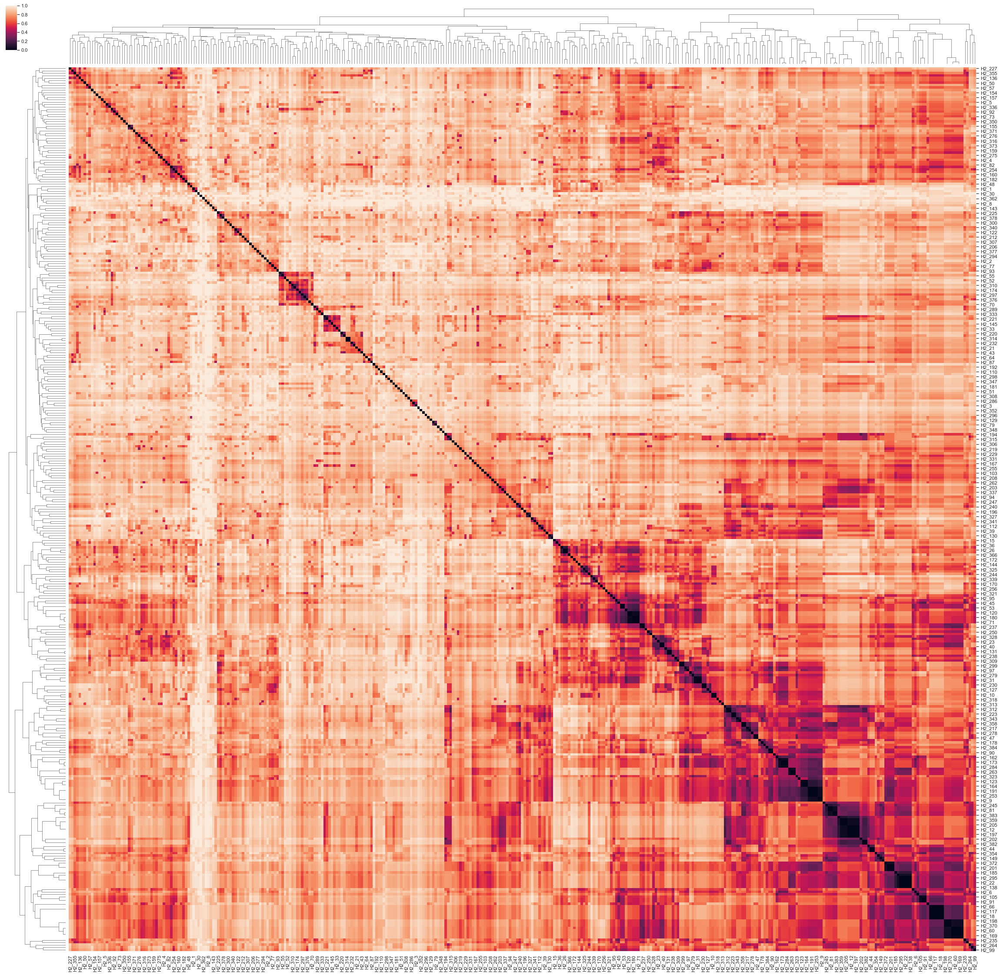

In [265]:
# for C5F10
#fig, ax = plt.subplots(1,1, figsize=(30,30))
df_C5F10 = pd.DataFrame( np.log(jointMatrix_C5F10+1), index=filter_allelecountsC5F10.index, columns=filter_allelecountsC5F10.index )
fig = sns.clustermap( df_C5F10, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5F10_filter4_alleleThreshold70.png',dpi=300)

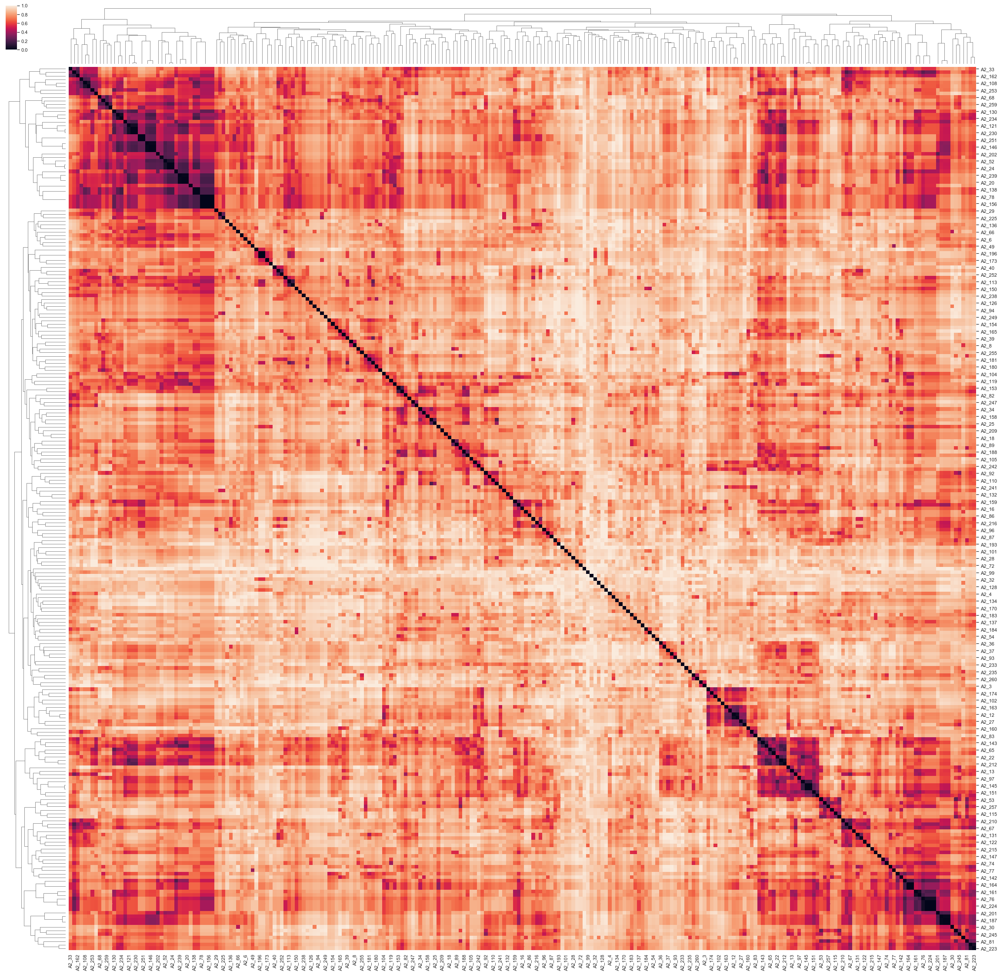

In [266]:
# For C5A9
df_C5A9 = pd.DataFrame( np.log(jointMatrix_C5A9+1), index=filter_allelecountsC5A9.index, columns=filter_allelecountsC5A9.index )
fig = sns.clustermap( df_C5A9, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5A9_filter4_alleleThreshold70.png',dpi=300)

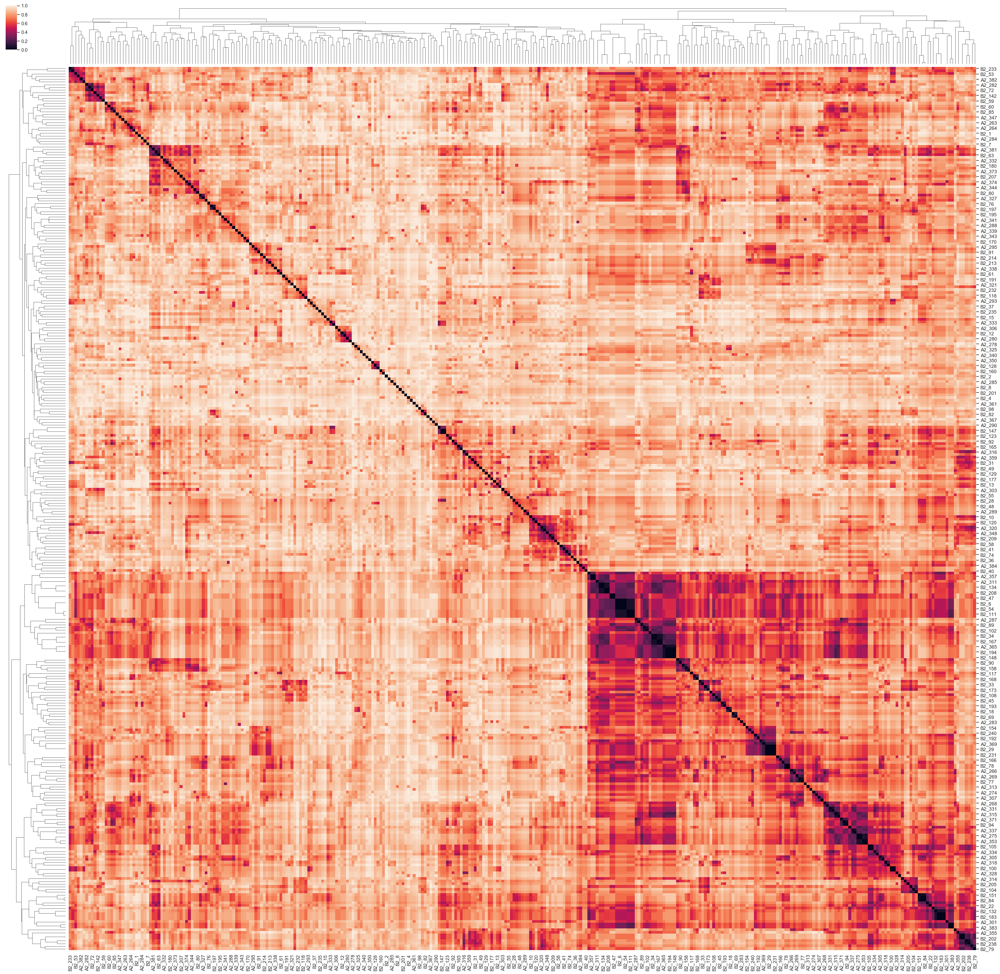

In [267]:
# For C5B10
df_C5B10 = pd.DataFrame( np.log(jointMatrix_C5B10+1), index=filter_allelecountsC5B10.index, columns=filter_allelecountsC5B10.index )
fig = sns.clustermap( df_C5B10, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5B10_filter4_alleleThreshold70.png',dpi=300)

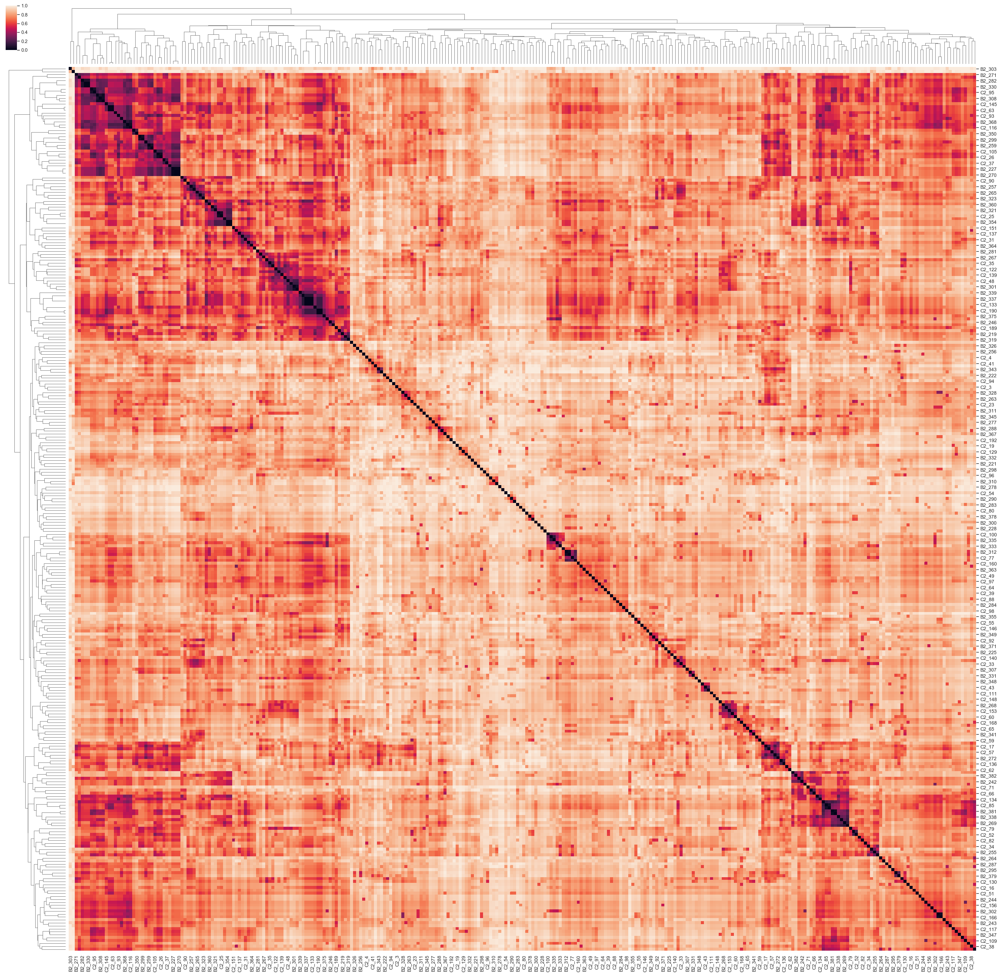

In [268]:
# For C5C6
df_C5C6 = pd.DataFrame( np.log(jointMatrix_C5C6+1), index=filter_allelecountsC5C6.index, columns=filter_allelecountsC5C6.index )
fig = sns.clustermap( df_C5C6, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5C6_filter4_alleleThreshold70.png',dpi=300)

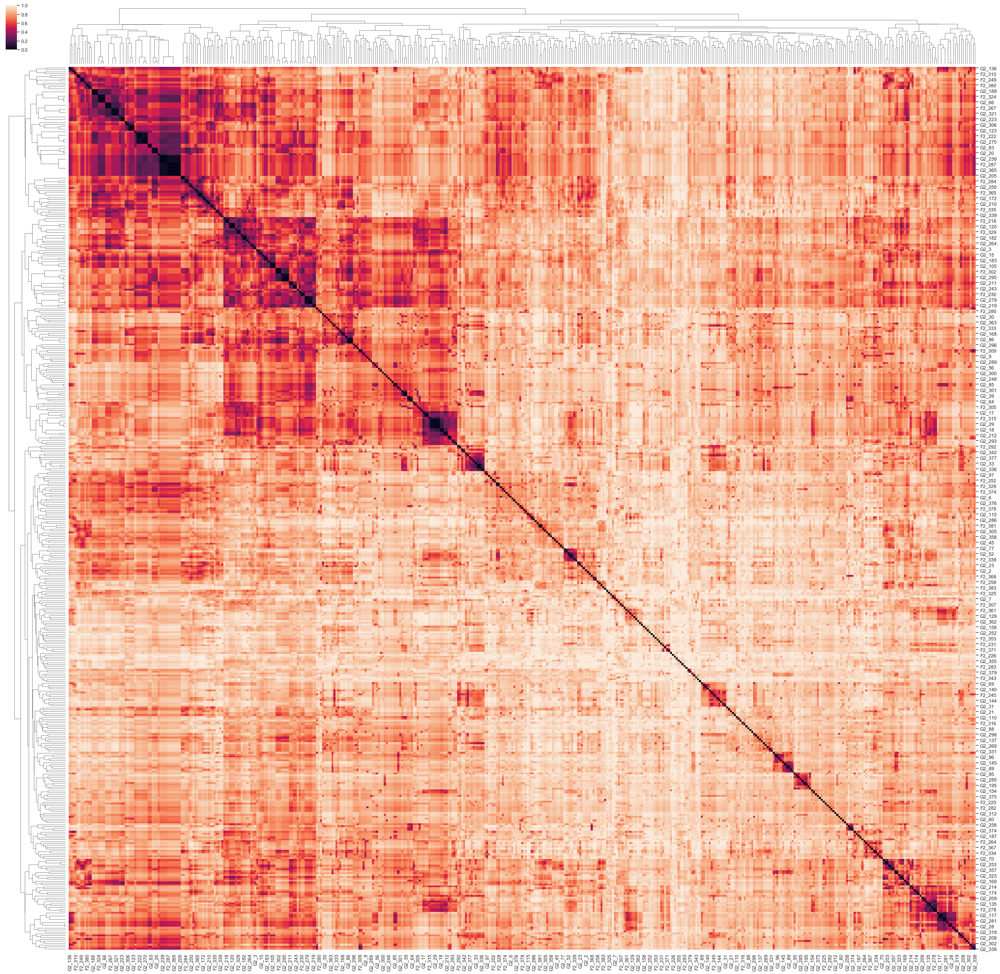

In [269]:
# For C5G7
df_C5G7 = pd.DataFrame( np.log(jointMatrix_C5G7+1), index=filter_allelecountsC5G7.index, columns=filter_allelecountsC5G7.index )
fig = sns.clustermap( df_C5G7, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5G7_filter4_alleleThreshold70.png',dpi=300)

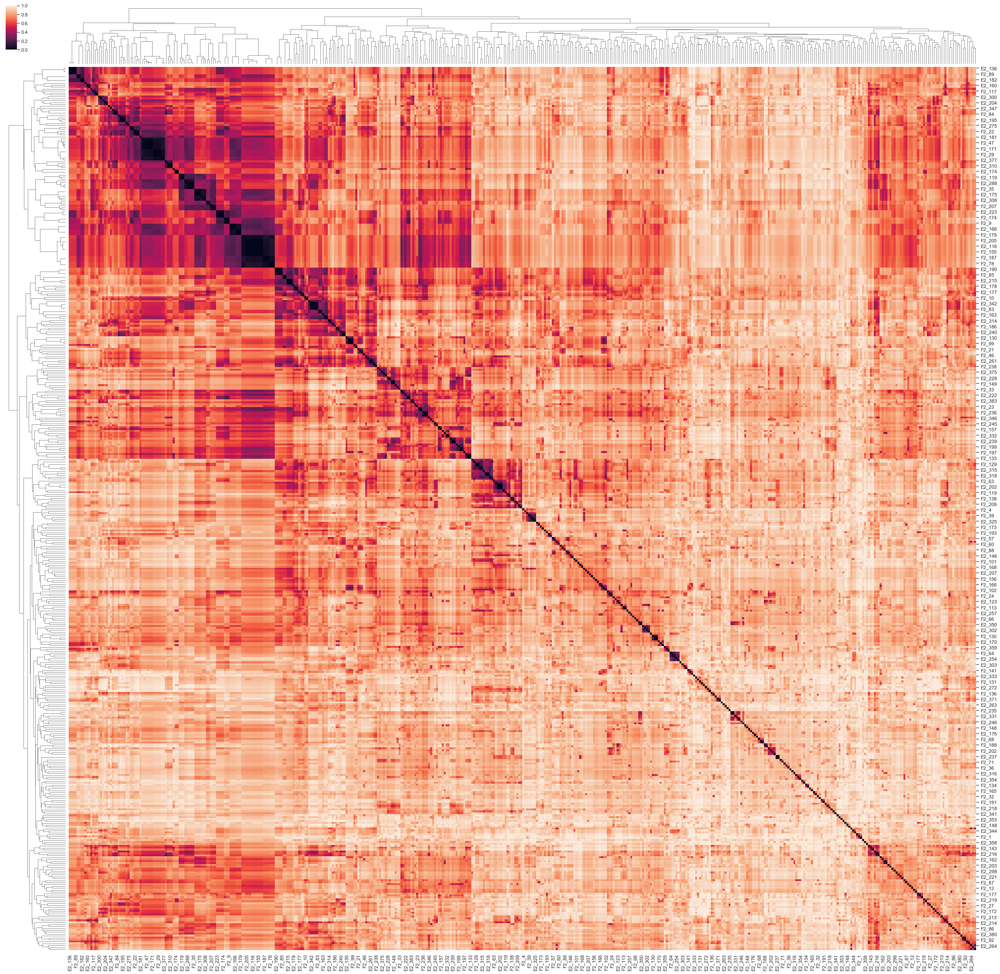

In [270]:
# For C5H11 
df_C5H11 = pd.DataFrame( np.log(jointMatrix_C5H11+1), index=filter_allelecountsC5H11.index, columns=filter_allelecountsC5H11.index )
fig = sns.clustermap( df_C5H11, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5H11_filter4_alleleThreshold70.png',dpi=300)

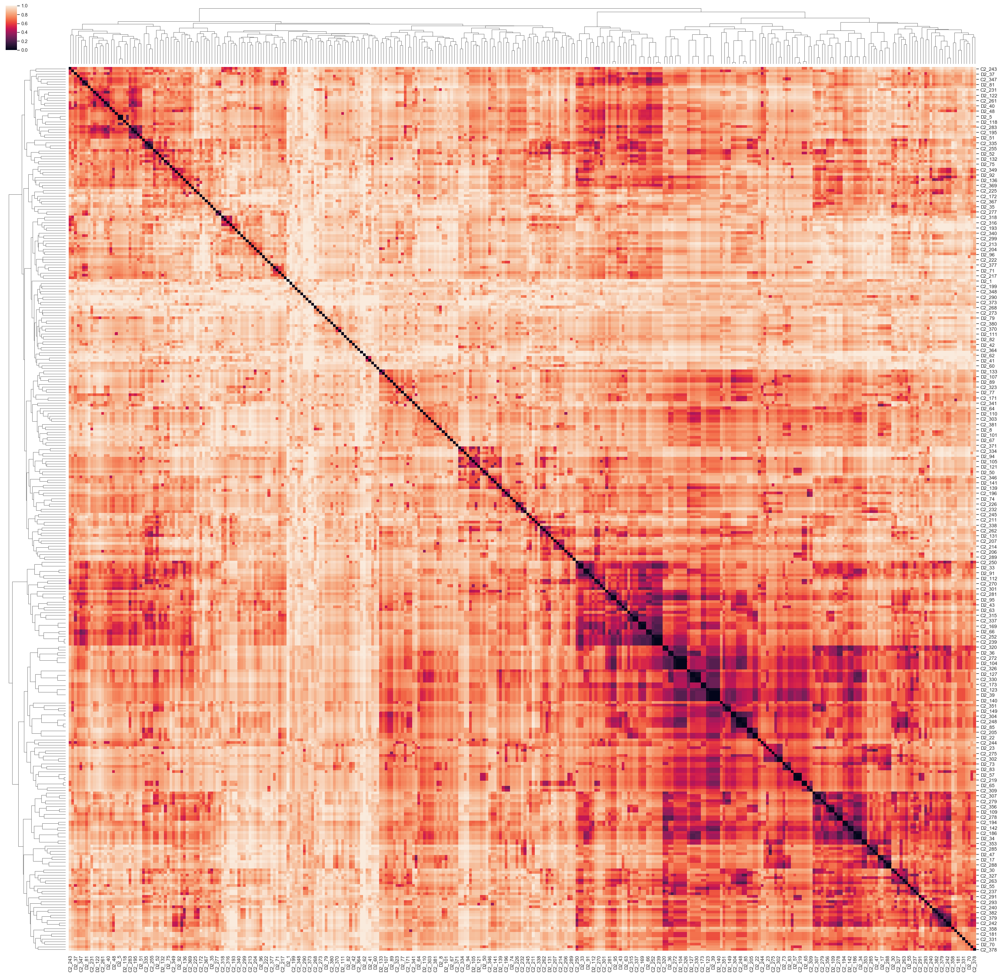

In [271]:
# For C5H7
df_C5H7 = pd.DataFrame( np.log(jointMatrix_C5H7+1), index=filter_allelecountsC5H7.index, columns=filter_allelecountsC5H7.index )
fig = sns.clustermap( df_C5H7, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5H7_filter4_alleleThreshold70.png',dpi=300)

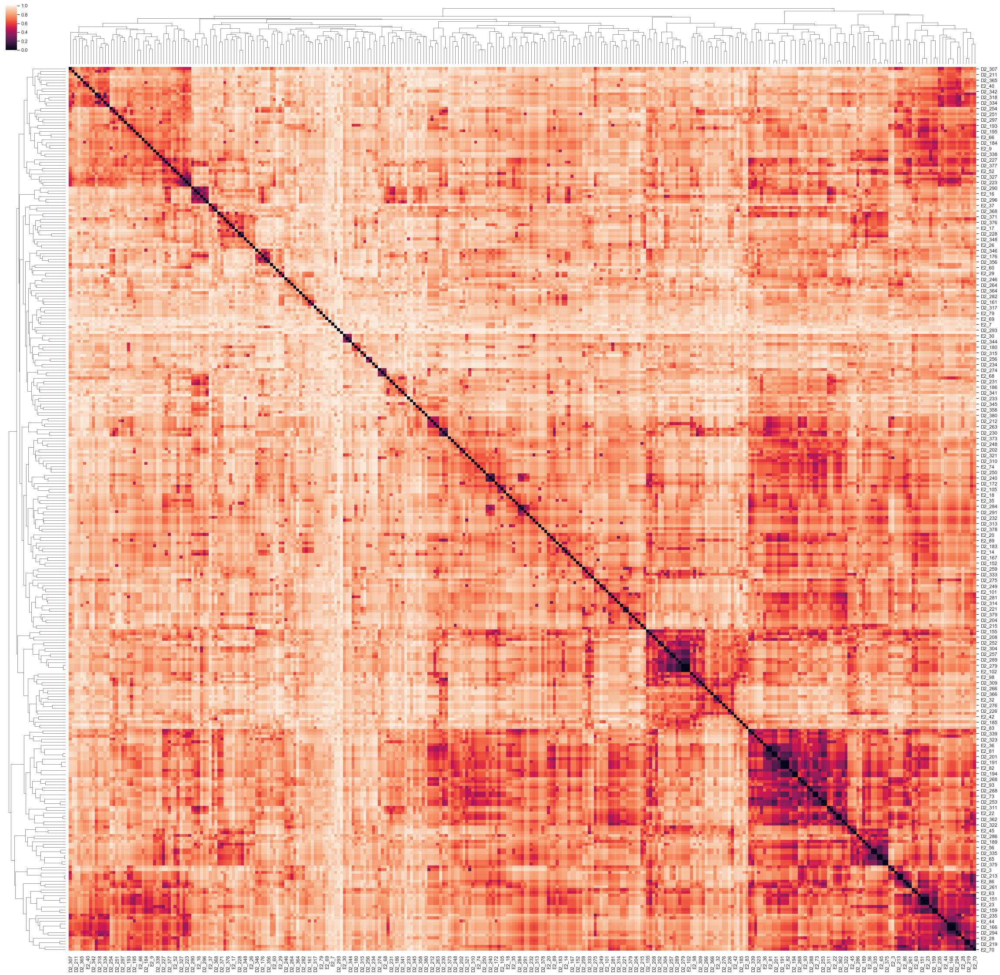

In [272]:
# For C5H9 
df_C5H9 = pd.DataFrame( np.log(jointMatrix_C5H9+1), index=filter_allelecountsC5H9.index, columns=filter_allelecountsC5H9.index )
fig = sns.clustermap( df_C5H9, vmin=0,vmax=1, figsize=(40,40), method='average',metric='euclidean')
fig.savefig(pathToSaveData + 'IWSS_C5H9_filter4_alleleThreshold70.png',dpi=300)

# Colours

In [13]:
cols=["black", "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#FEFFE6", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C",
    "#83AB58", "#001C1E", "#D1F7CE", "#004B28", "#C8D0F6", "#A3A489", "#806C66", "#222800",
    "#BF5650", "#E83000", "#66796D", "#DA007C", "#FF1A59", "#8ADBB4", "#1E0200", "#5B4E51",
    "#C895C5", "#320033", "#FF6832", "#66E1D3", "#CFCDAC", "#D0AC94", "#7ED379", "#012C58",
    "#7A7BFF", "#D68E01", "#353339", "#78AFA1", "#FEB2C6", "#75797C", "#837393", "#943A4D",
    "#B5F4FF", "#D2DCD5", "#9556BD", "#6A714A", "#001325", "#02525F", "#0AA3F7", "#E98176",
    "#DBD5DD", "#5EBCD1", "#3D4F44", "#7E6405", "#02684E", "#962B75", "#8D8546", "#9695C5",
    "#E773CE", "#D86A78", "#3E89BE", "#CA834E", "#518A87", "#5B113C", "#55813B", "#E704C4",
    "#00005F", "#A97399", "#4B8160", "#59738A", "#FF5DA7", "#F7C9BF", "#643127", "#513A01",
    "#6B94AA", "#51A058", "#A45B02", "#1D1702", "#E20027", "#E7AB63", "#4C6001", "#9C6966",
    "#64547B", "#97979E", "#006A66", "#391406", "#F4D749", "#0045D2", "#006C31", "#DDB6D0",
    "#7C6571", "#9FB2A4", "#00D891", "#15A08A", "#BC65E9", "#FFFFFE", "#C6DC99", "#203B3C",
    "#671190", "#6B3A64", "#F5E1FF", "#FFA0F2", "#CCAA35", "#374527", "#8BB400", "#797868",
    "#C6005A", "#3B000A", "#C86240", "#29607C", "#402334", "#7D5A44", "#CCB87C", "#B88183",
    "#AA5199", "#B5D6C3", "#A38469", "#9F94F0", "#A74571", "#B894A6", "#71BB8C", "#00B433",
    "#789EC9", "#6D80BA", "#953F00", "#5EFF03", "#E4FFFC", "#1BE177", "#BCB1E5", "#76912F",
    "#003109", "#0060CD", "#D20096", "#895563", "#29201D", "#5B3213", "#A76F42", "#89412E",
    "#1A3A2A", "#494B5A", "#A88C85", "#F4ABAA", "#A3F3AB", "#00C6C8", "#EA8B66", "#958A9F",
    "#BDC9D2", "#9FA064", "#BE4700", "#658188", "#83A485", "#453C23", "#47675D", "#3A3F00",
    "#061203", "#DFFB71", "#868E7E", "#98D058", "#6C8F7D", "#D7BFC2", "#3C3E6E", "#D83D66",
    "#2F5D9B", "#6C5E46", "#D25B88", "#5B656C", "#00B57F", "#545C46", "#866097", "#365D25",
    "#252F99", "#00CCFF", "#674E60", "#FC009C", "#92896B", "#1E2324", "#DEC9B2", "#9D4948",
    "#85ABB4", "#342142", "#D09685", "#A4ACAC", "#00FFFF", "#AE9C86", "#742A33", "#0E72C5",
    "#AFD8EC", "#C064B9", "#91028C", "#FEEDBF", "#FFB789", "#9CB8E4", "#AFFFD1", "#2A364C",
    "#4F4A43", "#647095", "#34BBFF", "#807781", "#920003", "#B3A5A7", "#018615", "#F1FFC8",
    "#976F5C", "#FF3BC1", "#FF5F6B", "#077D84", "#F56D93", "#5771DA", "#4E1E2A", "#830055",
    "#02D346", "#BE452D", "#00905E", "#BE0028", "#6E96E3", "#007699", "#FEC96D", "#9C6A7D",
    "#3FA1B8", "#893DE3", "#79B4D6", "#7FD4D9", "#6751BB", "#B28D2D", "#E27A05", "#DD9CB8",
    "#AABC7A", "#980034", "#561A02", "#8F7F00", "#635000", "#CD7DAE", "#8A5E2D", "#FFB3E1",
    "#6B6466", "#C6D300", "#0100E2", "#88EC69", "#8FCCBE", "#21001C", "#511F4D", "#E3F6E3",
    "#FF8EB1", "#6B4F29", "#A37F46", "#6A5950", "#1F2A1A", "#04784D", "#101835", "#E6E0D0",
    "#FF74FE", "#00A45F", "#8F5DF8", "#4B0059", "#412F23", "#D8939E", "#DB9D72", "#604143",
    "#B5BACE", "#989EB7", "#D2C4DB", "#A587AF", "#77D796", "#7F8C94", "#FF9B03", "#555196",
    "#31DDAE", "#74B671", "#802647", "#2A373F", "#014A68", "#696628", "#4C7B6D", "#002C27",
    "#7A4522", "#3B5859", "#E5D381", "#FFF3FF", "#679FA0", "#261300", "#2C5742", "#9131AF",
    "#AF5D88", "#C7706A", "#61AB1F", "#8CF2D4", "#C5D9B8", "#9FFFFB", "#BF45CC", "#493941",
    "#863B60", "#B90076", "#003177", "#C582D2", "#C1B394", "#602B70", "#887868", "#BABFB0",
    "#030012", "#D1ACFE", "#7FDEFE", "#4B5C71", "#A3A097", "#E66D53", "#637B5D", "#92BEA5",
    "#00F8B3", "#BEDDFF", "#3DB5A7", "#DD3248", "#B6E4DE", "#427745", "#598C5A", "#B94C59",
    "#8181D5", "#94888B", "#FED6BD", "#536D31", "#6EFF92", "#E4E8FF", "#20E200", "#FFD0F2",
    "#4C83A1", "#BD7322", "#915C4E", "#8C4787", "#025117", "#A2AA45", "#2D1B21", "#A9DDB0",
    "#FF4F78", "#528500", "#009A2E", "#17FCE4", "#71555A", "#525D82", "#00195A", "#967874",
    "#555558", "#0B212C", "#1E202B", "#EFBFC4", "#6F9755", "#6F7586", "#501D1D", "#372D00",
    "#741D16", "#5EB393", "#B5B400", "#DD4A38", "#363DFF", "#AD6552", "#6635AF", "#836BBA",
    "#98AA7F", "#464836", "#322C3E", "#7CB9BA", "#5B6965", "#707D3D", "#7A001D", "#6E4636",
    "#443A38", "#AE81FF", "#489079", "#897334", "#009087", "#DA713C", "#361618", "#FF6F01",
    "#006679", "#370E77", "#4B3A83", "#C9E2E6", "#C44170", "#FF4526", "#73BE54", "#C4DF72",
    "#ADFF60", "#00447D", "#DCCEC9", "#BD9479", "#656E5B", "#EC5200", "#FF6EC2", "#7A617E",
    "#DDAEA2", "#77837F", "#A53327", "#608EFF", "#B599D7", "#A50149", "#4E0025", "#C9B1A9",
    "#03919A", "#1B2A25", "#E500F1", "#982E0B", "#B67180", "#E05859", "#006039", "#578F9B",
    "#305230", "#CE934C", "#B3C2BE", "#C0BAC0", "#B506D3", "#170C10", "#4C534F", "#224451",
    "#3E4141", "#78726D", "#B6602B", "#200441", "#DDB588", "#497200", "#C5AAB6", "#033C61",
    "#71B2F5", "#A9E088", "#4979B0", "#A2C3DF", "#784149", "#2D2B17", "#3E0E2F", "#57344C",
    "#0091BE", "#E451D1", "#4B4B6A", "#5C011A", "#7C8060", "#FF9491", "#4C325D", "#005C8B",
    "#E5FDA4", "#68D1B6", "#032641", "#140023", "#8683A9", "#CFFF00", "#A72C3E", "#34475A",
    "#B1BB9A", "#B4A04F", "#8D918E", "#A168A6", "#813D3A", "#425218", "#DA8386", "#776133",
    "#563930", "#8498AE", "#90C1D3", "#B5666B", "#9B585E", "#856465", "#AD7C90", "#E2BC00",
    "#E3AAE0", "#B2C2FE", "#FD0039", "#009B75", "#FFF46D", "#E87EAC", "#DFE3E6", "#848590",
    "#AA9297", "#83A193", "#577977", "#3E7158", "#C64289", "#EA0072", "#C4A8CB", "#55C899",
    "#E78FCF", "#004547", "#F6E2E3", "#966716", "#378FDB", "#435E6A", "#DA0004", "#1B000F",
    "#5B9C8F", "#6E2B52", "#011115", "#E3E8C4", "#AE3B85", "#EA1CA9", "#FF9E6B", "#457D8B",
    "#92678B", "#00CDBB", "#9CCC04", "#002E38", "#96C57F", "#CFF6B4", "#492818", "#766E52",
    "#20370E", "#E3D19F", "#2E3C30", "#B2EACE", "#F3BDA4", "#A24E3D", "#976FD9", "#8C9FA8",
    "#7C2B73", "#4E5F37", "#5D5462", "#90956F", "#6AA776", "#DBCBF6", "#DA71FF", "#987C95",
    "#52323C", "#BB3C42", "#584D39", "#4FC15F", "#A2B9C1", "#79DB21", "#1D5958", "#BD744E",
    "#160B00", "#20221A", "#6B8295", "#00E0E4", "#102401", "#1B782A", "#DAA9B5", "#B0415D",
    "#859253", "#97A094", "#06E3C4", "#47688C", "#7C6755", "#075C00", "#7560D5", "#7D9F00",
    "#C36D96", "#4D913E", "#5F4276", "#FCE4C8", "#303052", "#4F381B", "#E5A532", "#706690",
    "#AA9A92", "#237363", "#73013E", "#FF9079", "#A79A74", "#029BDB", "#FF0169", "#C7D2E7",
    "#CA8869", "#80FFCD", "#BB1F69", "#90B0AB", "#7D74A9", "#FCC7DB", "#99375B", "#00AB4D",
    "#ABAED1", "#BE9D91", "#E6E5A7", "#332C22", "#DD587B", "#F5FFF7", "#5D3033", "#6D3800",
    "#FF0020", "#B57BB3", "#D7FFE6", "#C535A9", "#260009", "#6A8781", "#A8ABB4", "#D45262",
    "#794B61", "#4621B2", "#8DA4DB", "#C7C890", "#6FE9AD", "#A243A7", "#B2B081", "#181B00",
    "#286154", "#4CA43B", "#6A9573", "#A8441D", "#5C727B", "#738671", "#D0CFCB", "#897B77",
    "#1F3F22", "#4145A7", "#DA9894", "#A1757A", "#63243C", "#ADAAFF", "#00CDE2", "#DDBC62",
    "#698EB1", "#208462", "#00B7E0", "#614A44", "#9BBB57", "#7A5C54", "#857A50", "#766B7E",
    "#014833", "#FF8347", "#7A8EBA", "#274740", "#946444", "#EBD8E6", "#646241", "#373917",
    "#6AD450", "#81817B", "#D499E3", "#979440", "#011A12", "#526554", "#B5885C", "#A499A5",
    "#03AD89", "#B3008B", "#E3C4B5", "#96531F", "#867175", "#74569E", "#617D9F", "#E70452",
    "#067EAF", "#A697B6", "#B787A8", "#9CFF93", "#311D19", "#3A9459", "#6E746E", "#B0C5AE",
    "#84EDF7", "#ED3488", "#754C78", "#384644", "#C7847B", "#00B6C5", "#7FA670", "#C1AF9E",
    "#2A7FFF", "#72A58C", "#FFC07F", "#9DEBDD", "#D97C8E", "#7E7C93", "#62E674", "#B5639E",
    "#FFA861", "#C2A580", "#8D9C83", "#B70546", "#372B2E", "#0098FF", "#985975", "#20204C",
    "#FF6C60", "#445083", "#8502AA", "#72361F", "#9676A3", "#484449", "#CED6C2", "#3B164A",
    "#CCA763", "#2C7F77", "#02227B", "#A37E6F", "#CDE6DC", "#CDFFFB", "#BE811A", "#F77183",
    "#EDE6E2", "#CDC6B4", "#FFE09E", "#3A7271", "#FF7B59", "#4E4E01", "#4AC684", "#8BC891",
    "#BC8A96", "#CF6353", "#DCDE5C", "#5EAADD", "#F6A0AD", "#E269AA", "#A3DAE4", "#436E83",
    "#002E17", "#ECFBFF", "#A1C2B6", "#50003F", "#71695B", "#67C4BB", "#536EFF", "#5D5A48",
    "#890039", "#969381", "#371521", "#5E4665", "#AA62C3", "#8D6F81", "#2C6135", "#410601",
    "#564620", "#E69034", "#6DA6BD", "#E58E56", "#E3A68B", "#48B176", "#D27D67", "#B5B268",
    "#7F8427", "#FF84E6", "#435740", "#EAE408", "#F4F5FF", "#325800", "#4B6BA5", "#ADCEFF",
    "#9B8ACC", "#885138", "#5875C1", "#7E7311", "#FEA5CA", "#9F8B5B", "#A55B54", "#89006A",
    "#AF756F", "#2A2000", "#7499A1", "#FFB550", "#00011E", "#D1511C", "#688151", "#BC908A",
    "#78C8EB", "#8502FF", "#483D30", "#C42221", "#5EA7FF", "#785715", "#0CEA91", "#FFFAED",
    "#B3AF9D", "#3E3D52", "#5A9BC2", "#9C2F90", "#8D5700", "#ADD79C", "#00768B", "#337D00",
    "#C59700", "#3156DC", "#944575", "#ECFFDC", "#D24CB2", "#97703C", "#4C257F", "#9E0366",
    "#88FFEC", "#B56481", "#396D2B", "#56735F", "#988376", "#9BB195", "#A9795C", "#E4C5D3",
    "#9F4F67", "#1E2B39", "#664327", "#AFCE78", "#322EDF", "#86B487", "#C23000", "#ABE86B",
    "#96656D", "#250E35", "#A60019", "#0080CF", "#CAEFFF", "#323F61", "#A449DC", "#6A9D3B",
    "#FF5AE4", "#636A01", "#D16CDA", "#736060", "#FFBAAD", "#D369B4", "#FFDED6", "#6C6D74",
    "#927D5E", "#845D70", "#5B62C1", "#2F4A36", "#E45F35", "#FF3B53", "#AC84DD", "#762988",
    "#70EC98", "#408543", "#2C3533", "#2E182D", "#323925", "#19181B", "#2F2E2C", "#023C32",
    "#9B9EE2", "#58AFAD", "#5C424D", "#7AC5A6", "#685D75", "#B9BCBD", "#834357", "#1A7B42",
    "#2E57AA", "#E55199", "#316E47", "#CD00C5", "#6A004D", "#7FBBEC", "#F35691", "#D7C54A",
    "#62ACB7", "#CBA1BC", "#A28A9A", "#6C3F3B", "#FFE47D", "#DCBAE3", "#5F816D", "#3A404A",
    "#7DBF32", "#E6ECDC", "#852C19", "#285366", "#B8CB9C", "#0E0D00", "#4B5D56", "#6B543F",
    "#E27172", "#0568EC", "#2EB500", "#D21656", "#EFAFFF", "#682021", "#2D2011", "#DA4CFF",
    "#70968E", "#FF7B7D", "#4A1930", "#E8C282", "#E7DBBC", "#A68486", "#1F263C", "#36574E",
    "#52CE79", "#ADAAA9", "#8A9F45", "#6542D2", "#00FB8C", "#5D697B", "#CCD27F", "#94A5A1",
    "#790229", "#E383E6", "#7EA4C1", "#4E4452", "#4B2C00", "#620B70", "#314C1E", "#874AA6",
    "#E30091", "#66460A", "#EB9A8B", "#EAC3A3", "#98EAB3", "#AB9180", "#B8552F", "#1A2B2F",
    "#94DDC5", "#9D8C76", "#9C8333", "#94A9C9", "#392935", "#8C675E", "#CCE93A", "#917100",
    "#01400B", "#449896", "#1CA370", "#E08DA7", "#8B4A4E", "#667776", "#4692AD", "#67BDA8",
    "#69255C", "#D3BFFF", "#4A5132", "#7E9285", "#77733C", "#E7A0CC", "#51A288", "#2C656A",
    "#4D5C5E", "#C9403A", "#DDD7F3", "#005844", "#B4A200", "#488F69", "#858182", "#D4E9B9",
    "#3D7397", "#CAE8CE", "#D60034", "#AA6746", "#9E5585", "#BA6200"]